# Predicting diabetes status using NHANES

[DSLC stages]: Analysis



The following code sets up the libraries and creates cleaned and pre-processed training, validation and test data that we will use in this document.

In [ ]:
pip install ruptures torch pandas

In [1]:
import pandas as pd
import numpy as np

# Load the datasets from CSV files
train_data = pd.read_csv('train_data.csv')
val_data = pd.read_csv('val_data.csv')
test_data = pd.read_csv('test_data.csv')
dictionary = pd.read_csv('dictionary.csv', index_col=0)

train_time_data = pd.read_csv('train_time_data.csv')
val_time_data = pd.read_csv('val_time_data.csv')
test_time_data = pd.read_csv('test_time_data.csv')
dict_time_series = pd.read_csv('dict_time_series.csv', index_col=0)

data_States = pd.read_csv('data_States.csv')
data_register = pd.read_csv('data_register.csv')
data_income = pd.read_csv('data_income.csv')
data_noVote = pd.read_csv('data_noVote.csv')

In [24]:
import importlib
# Import the function
from functions import explore_data_helper

# Reload the module to reflect any updates
importlib.reload(explore_data_helper)

# create a list of 100 perturbed versions of ames_train_preprocessed using the perturb_ames function
perturbed_data = [explore_data_helper.perturb_dataframe(train_time_data) for i in range(100)]

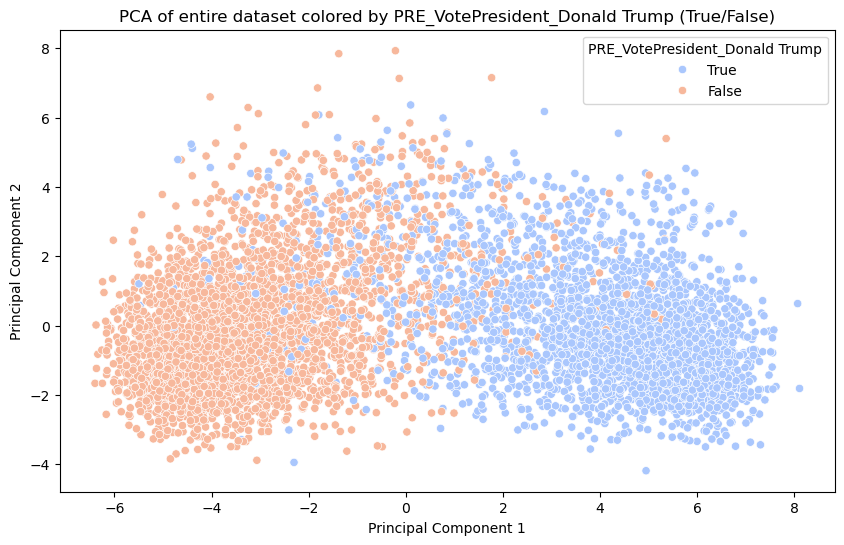

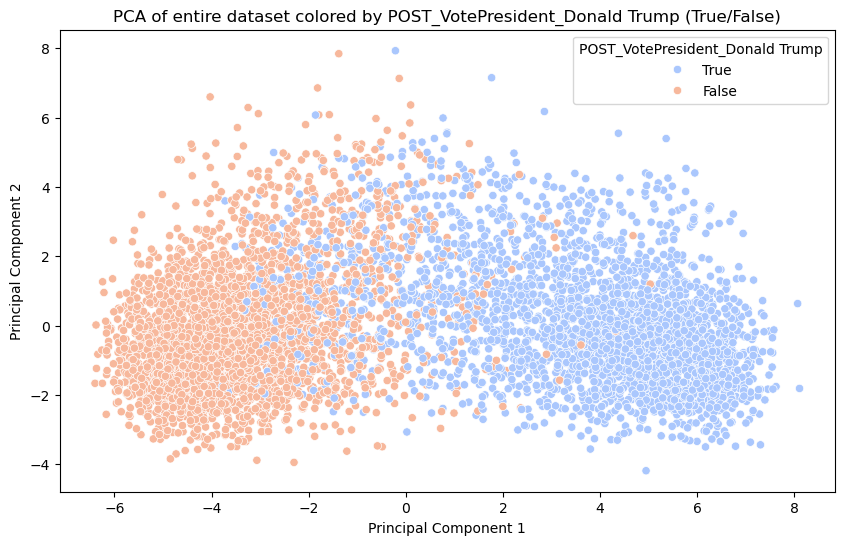

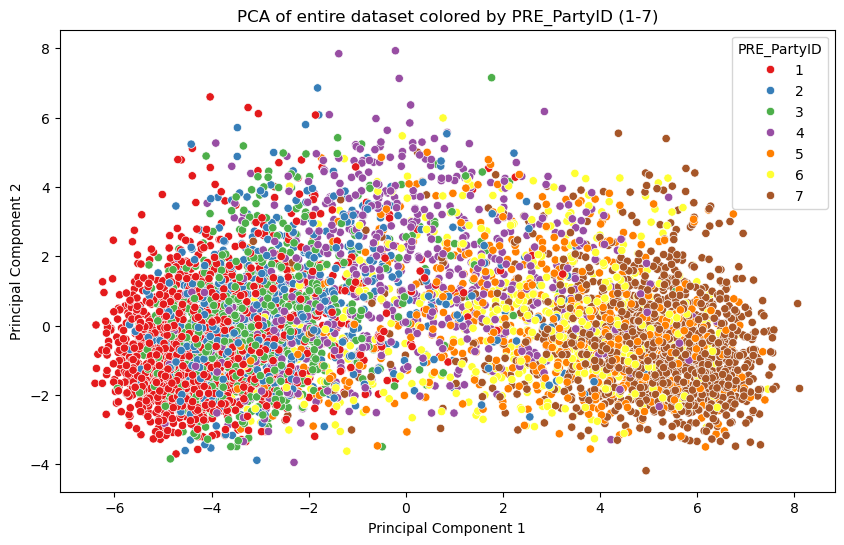

In [52]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the data before PCA
scaler = StandardScaler()
scaled_data = scaler.fit_transform(train_data)

# Apply PCA to the data and reduce it to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)

pca_df = pd.DataFrame()

# Add the PCA components to the dataframe
pca_df['PC1'] = pca_components[:, 0]
pca_df['PC2'] = pca_components[:, 1]

# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['PRE_VotePresident_Donald Trump'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by PRE_VotePresident_Donald Trump (True/False)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='PRE_VotePresident_Donald Trump')
plt.show()

# Plot the data colored by 'POST_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['POST_VotePresident_Donald Trump'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by POST_VotePresident_Donald Trump (True/False)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='POST_VotePresident_Donald Trump')
plt.show()

# Plot the data colored by 'PRE_PartyID' (values 1-7)
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['PRE_PartyID'], 
                palette='Set1', legend='full')
plt.title('PCA of entire dataset colored by PRE_PartyID (1-7)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='PRE_PartyID')
plt.show()


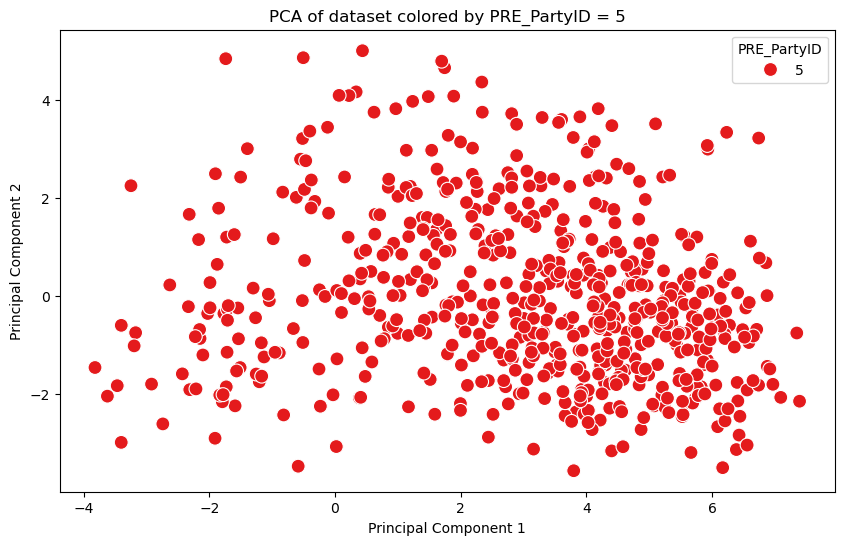

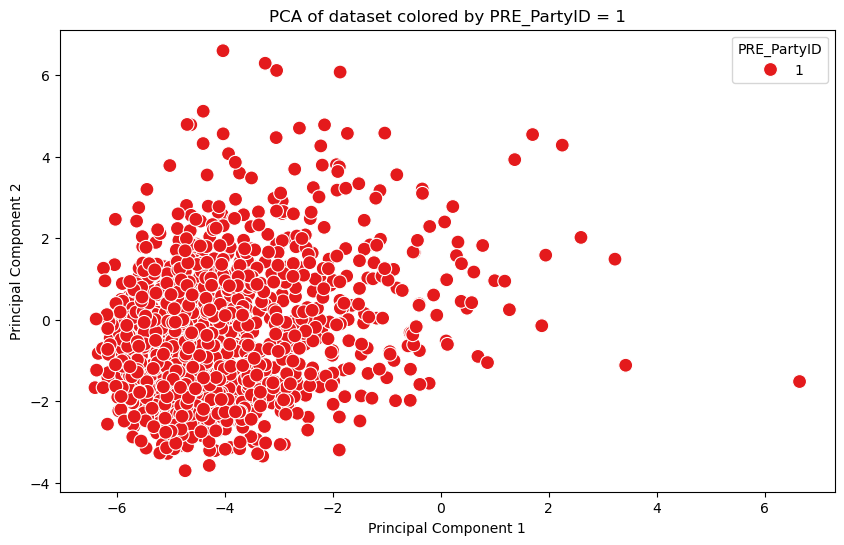

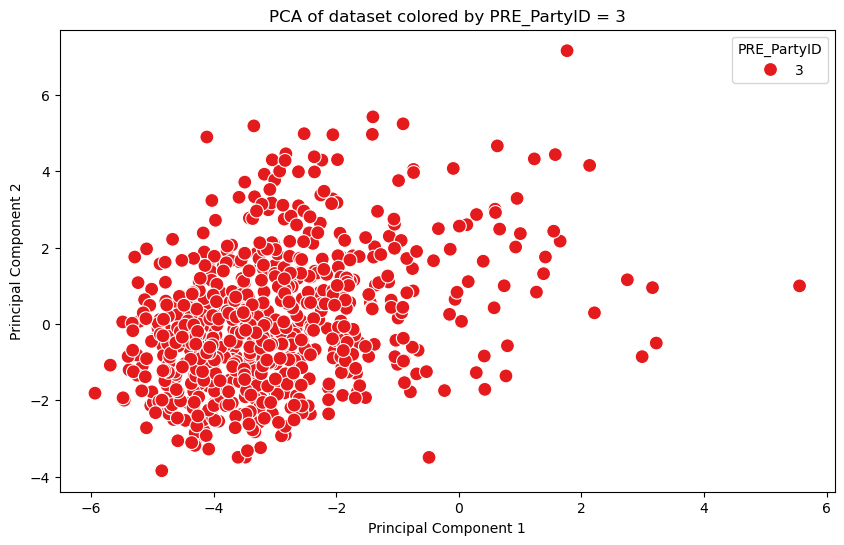

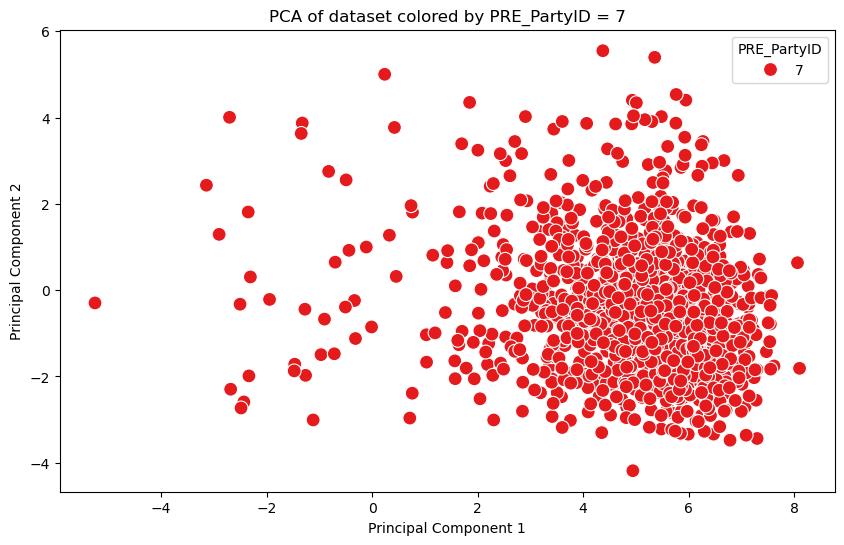

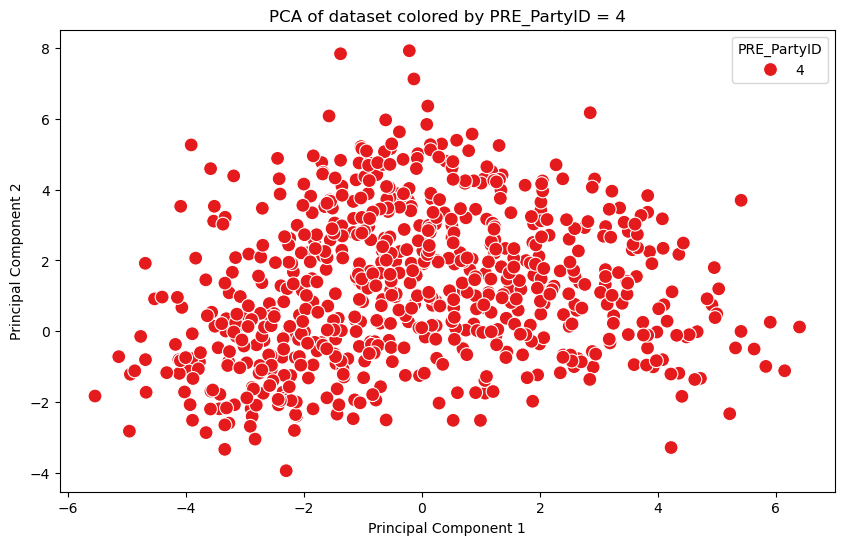

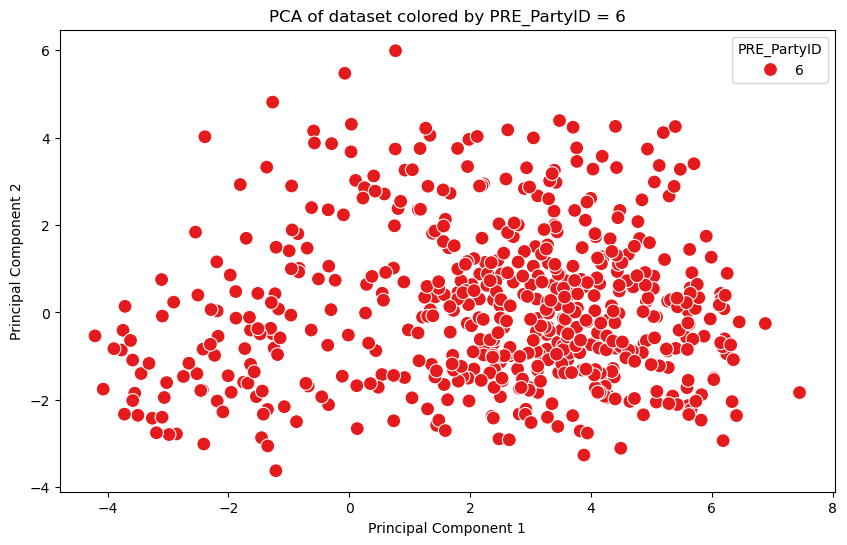

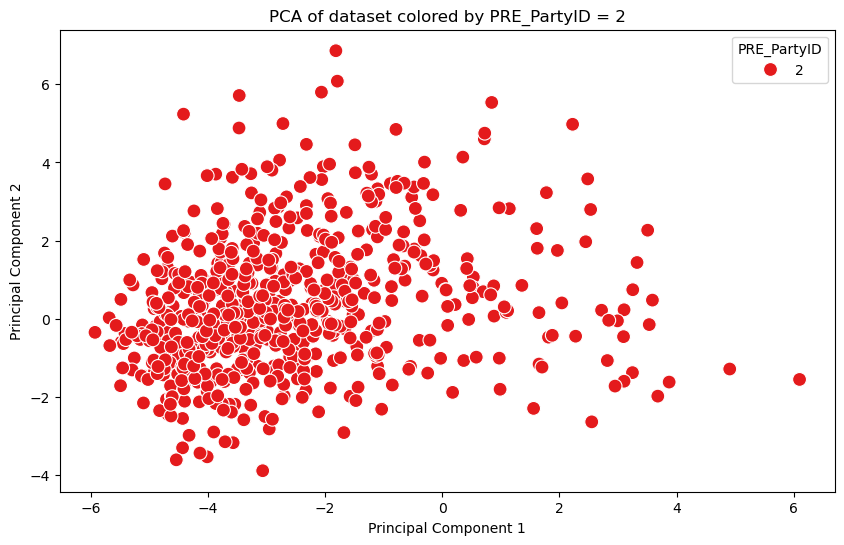

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler


# Plot the data for each PRE_PartyID value separately
party_ids = train_data['PRE_PartyID'].unique()

pca_df['PRE_PartyID'] = train_data['PRE_PartyID'].values

# Loop through each party ID value and plot the data
for party_id in party_ids:
    plt.figure(figsize=(10, 6))
    
    # Filter data for the specific party ID value
    party_data = pca_df[pca_df['PRE_PartyID'] == party_id]
    
    # Plotting
    sns.scatterplot(x=party_data['PC1'], y=party_data['PC2'], hue=party_data['PRE_PartyID'], 
                    palette='Set1', legend='full', markers='o', s=100)
    
    # Title and labels
    plt.title(f'PCA of dataset colored by PRE_PartyID = {party_id}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.legend(title='PRE_PartyID')
    plt.show()


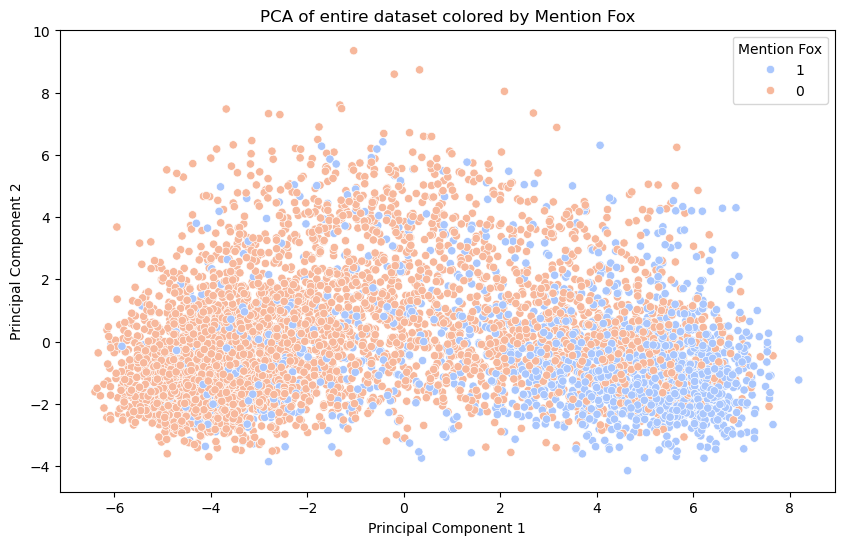

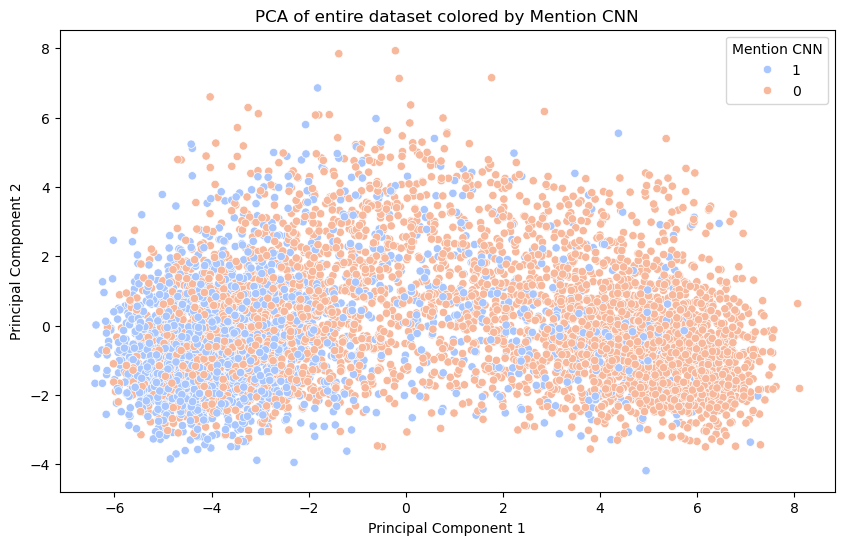

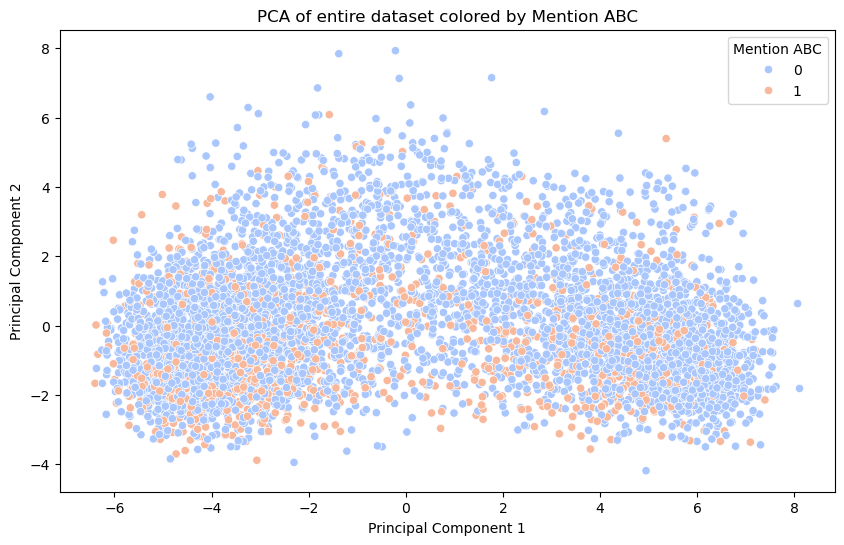

In [60]:
# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=train_data['PC1'], y=train_data['PC2'], hue=train_data['mentionFox'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by Mention Fox')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention Fox')
plt.show()

# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['mentionCNN'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by Mention CNN')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention CNN')
plt.show()

# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['mentionABC'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by Mention ABC')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention ABC')
plt.show()

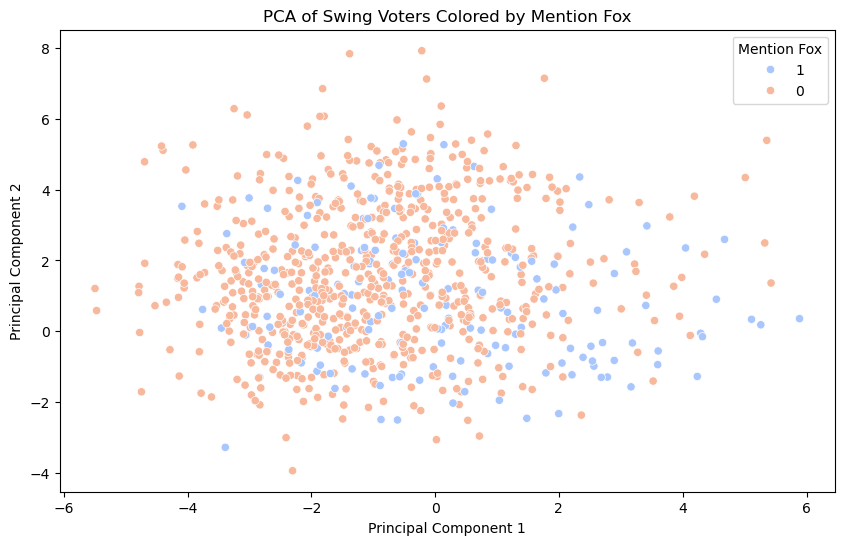

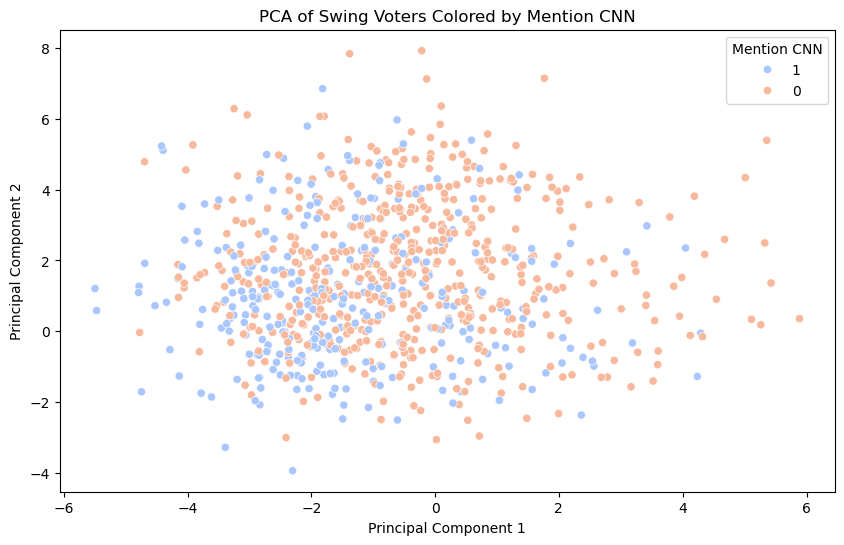

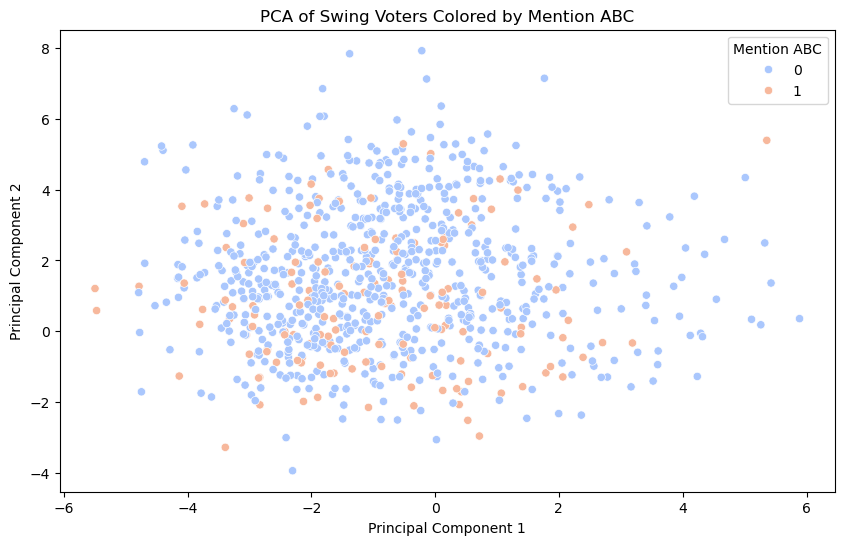

In [133]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter the data for swing_voters

pca_df['swing_vote'] = train_data['swing_vote']
swing_voters_data = pca_df[pca_df['swing_vote'] == True]

# Plot the data colored by 'mentionFox'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=swing_voters_data['PC1'], y=swing_voters_data['PC2'], 
                hue=train_data['mentionFox'].astype(str), palette='coolwarm', legend='full')
plt.title('PCA of Swing Voters Colored by Mention Fox')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention Fox')
plt.show()

# Plot the data colored by 'mentionCNN'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=swing_voters_data['PC1'], y=swing_voters_data['PC2'], 
                hue=train_data['mentionCNN'].astype(str), palette='coolwarm', legend='full')
plt.title('PCA of Swing Voters Colored by Mention CNN')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention CNN')
plt.show()

# Plot the data colored by 'mentionABC'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=swing_voters_data['PC1'], y=swing_voters_data['PC2'], 
                hue=train_data['mentionABC'].astype(str), palette='coolwarm', legend='full')
plt.title('PCA of Swing Voters Colored by Mention ABC')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Mention ABC')
plt.show()


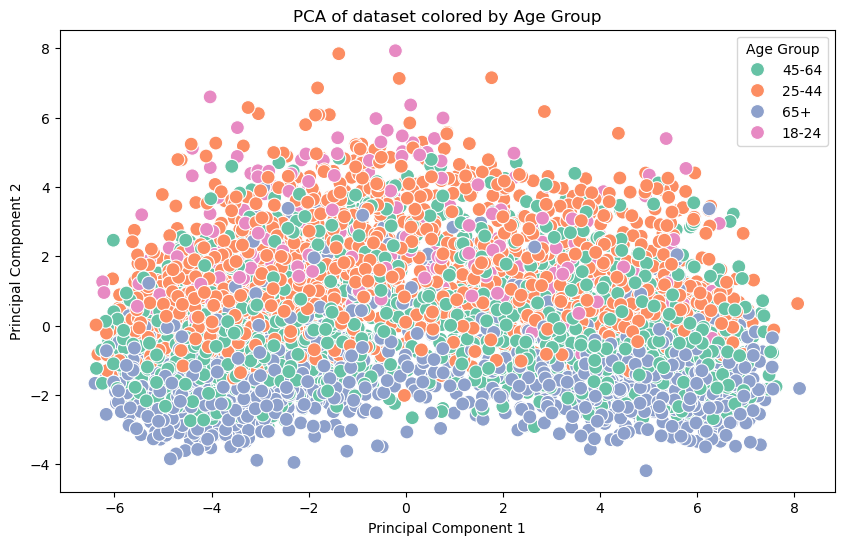

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Categorize the 'age' column into age groups
def categorize_age(age):
    if 18 <= age <= 24:
        return '18-24'
    elif 25 <= age <= 44:
        return '25-44'
    elif 45 <= age <= 64:
        return '45-64'
    else:
        return '65+'

# Apply the categorization function to the 'age' column
train_data['age_group'] = train_data['Age'].apply(categorize_age)

# Standardizing the data before PCA (same as before)
columns_for_pca = [col for col in train_data.columns if col not in ['PRE_VotePresident_Donald Trump', 
                                                                   'POST_VotePresident_Donald Trump', 
                                                                   'PRE_PartyID', 'Age', 'age_group']]

scaler = StandardScaler()
scaled_data = scaler.fit_transform(train_data[columns_for_pca])

# Apply PCA to the data and reduce it to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(scaled_data)

# Add the PCA components to the dataframe
train_data['PC1'] = pca_components[:, 0]
train_data['PC2'] = pca_components[:, 1]

# Plot all the data with colors based on age group
plt.figure(figsize=(10, 6))

# Plotting the scatter plot
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['age_group'], 
                palette='Set2', legend='full', markers='o', s=100)

# Title and labels
plt.title('PCA of dataset colored by Age Group')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Age Group')

plt.show()


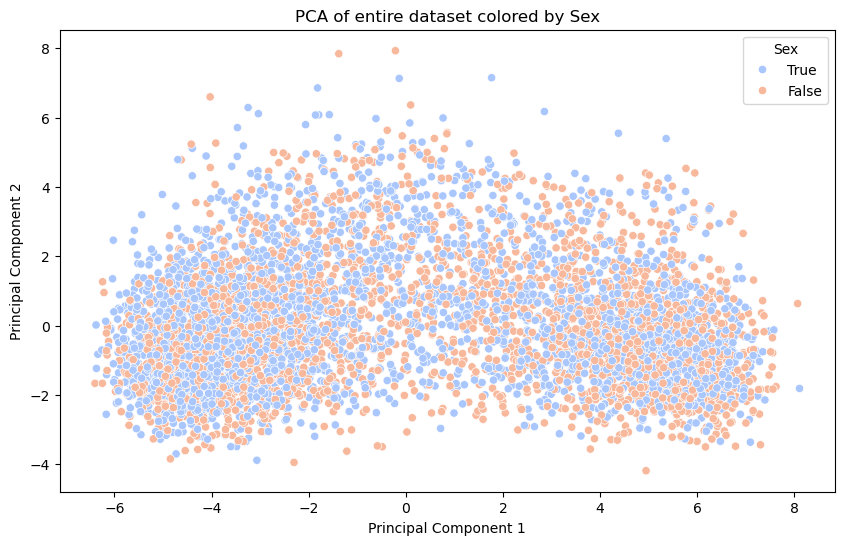

In [57]:
# Plot the data colored by 'PRE_VotePresident_Donald Trump'
plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_df['PC1'], y=pca_df['PC2'], hue=train_data['Sex_Female'].astype(str), 
                palette='coolwarm', legend='full')
plt.title('PCA of entire dataset colored by Sex')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Sex')
plt.show()

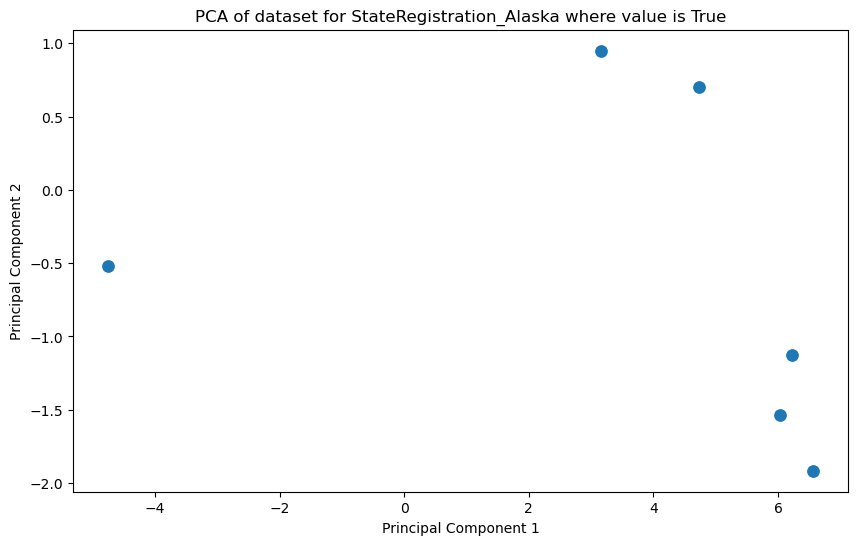

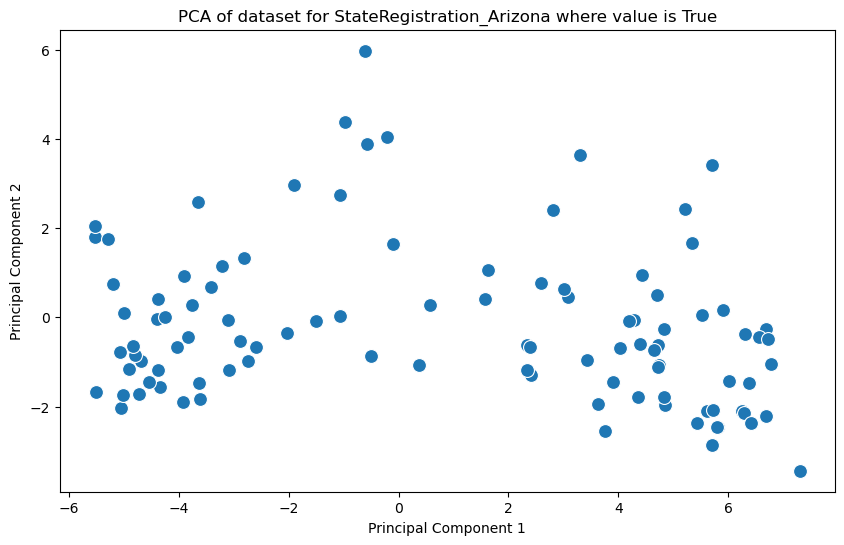

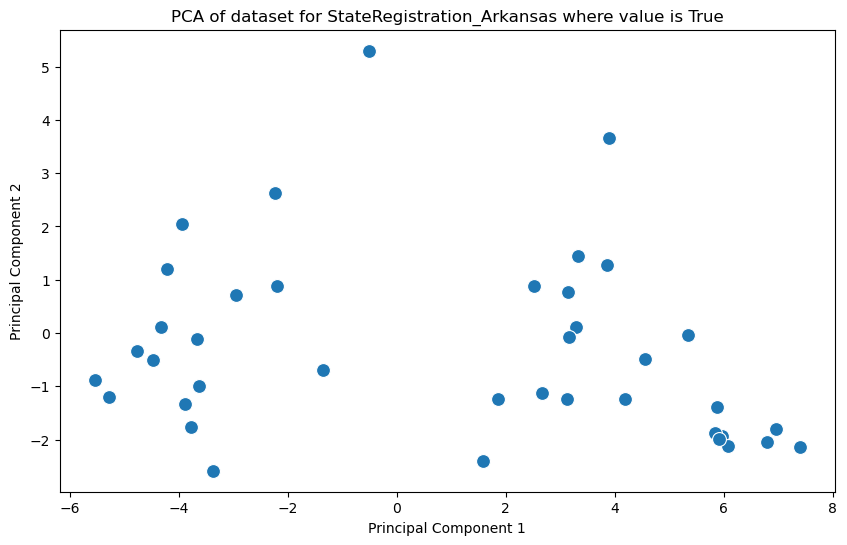

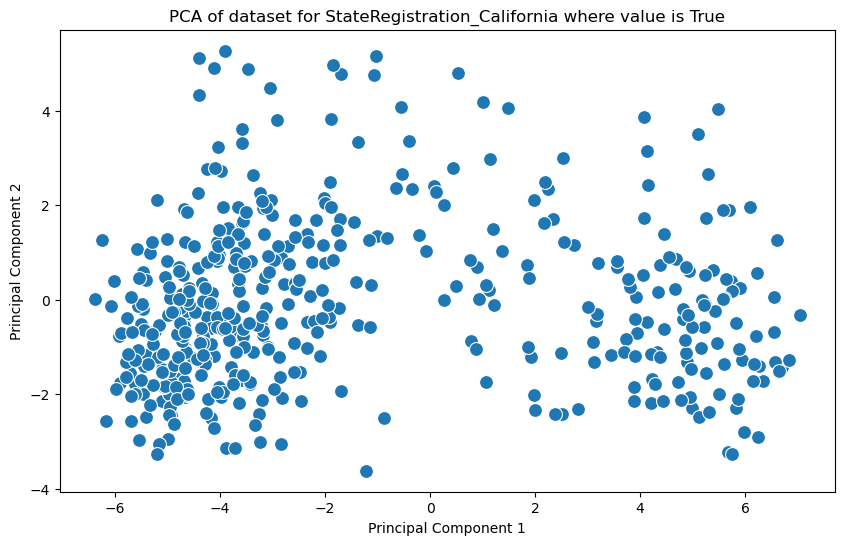

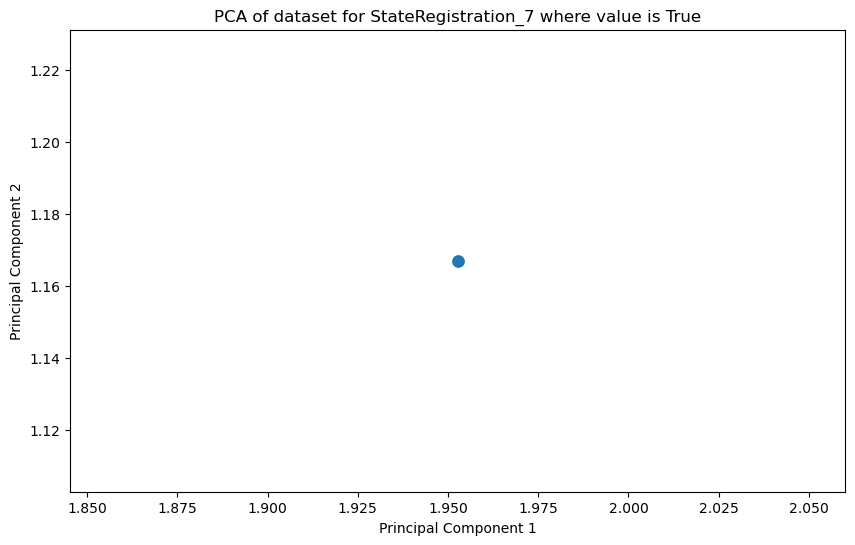

...

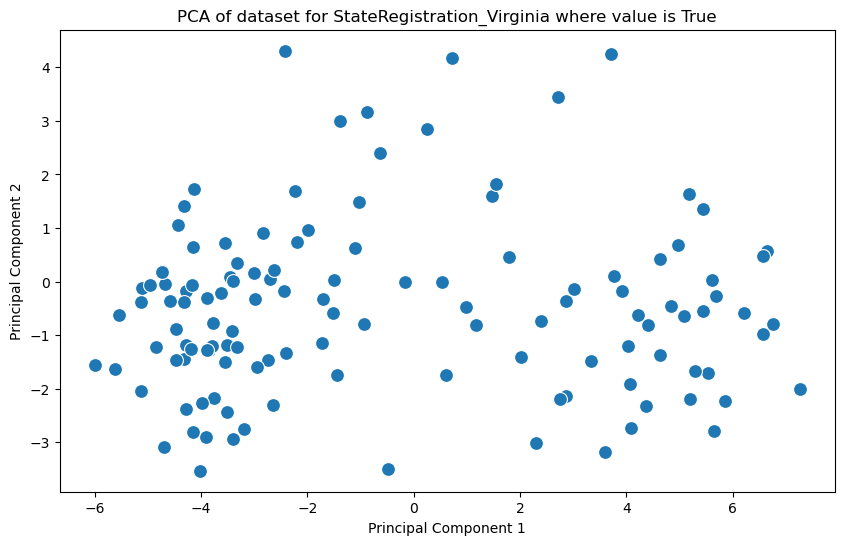

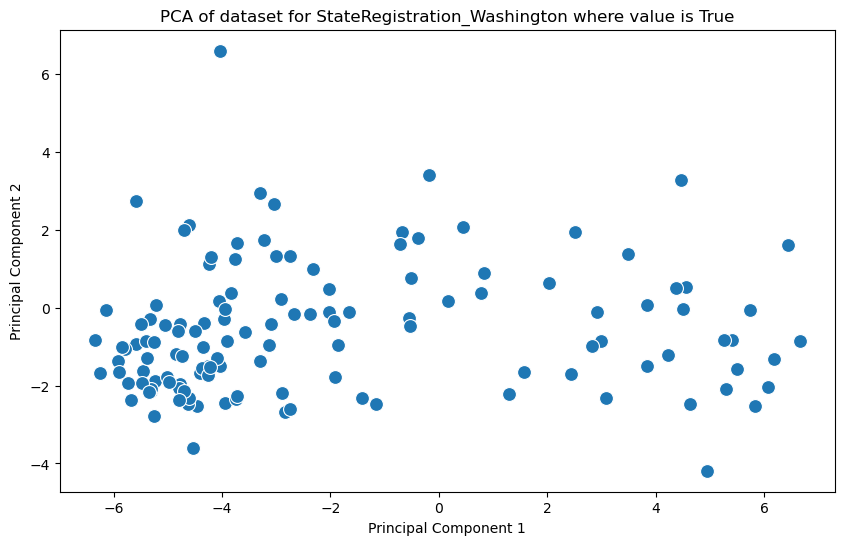

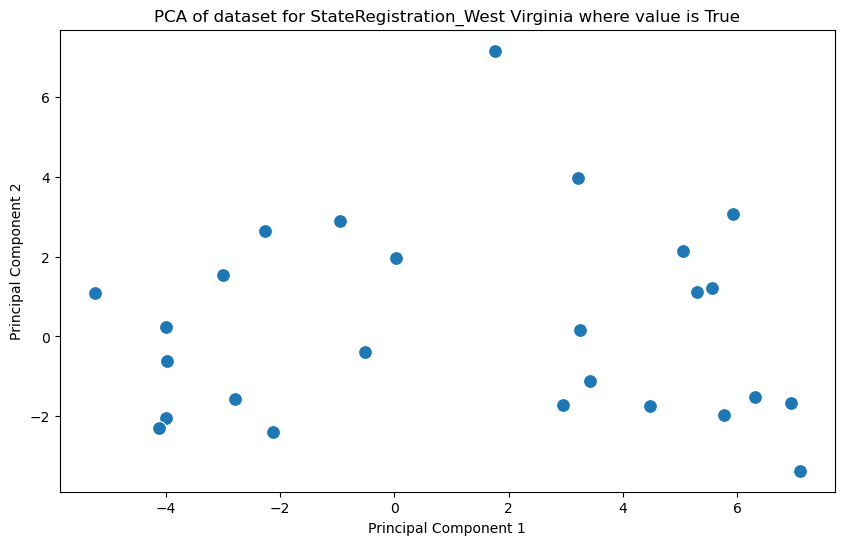

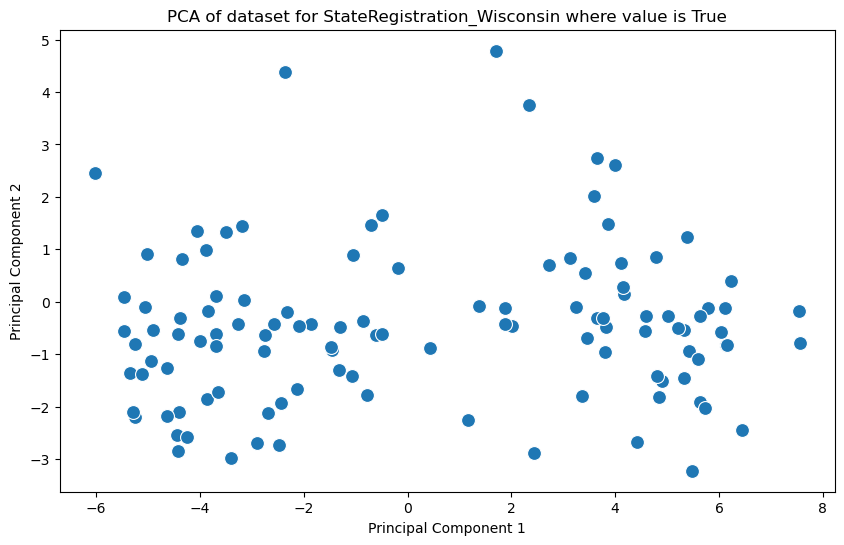

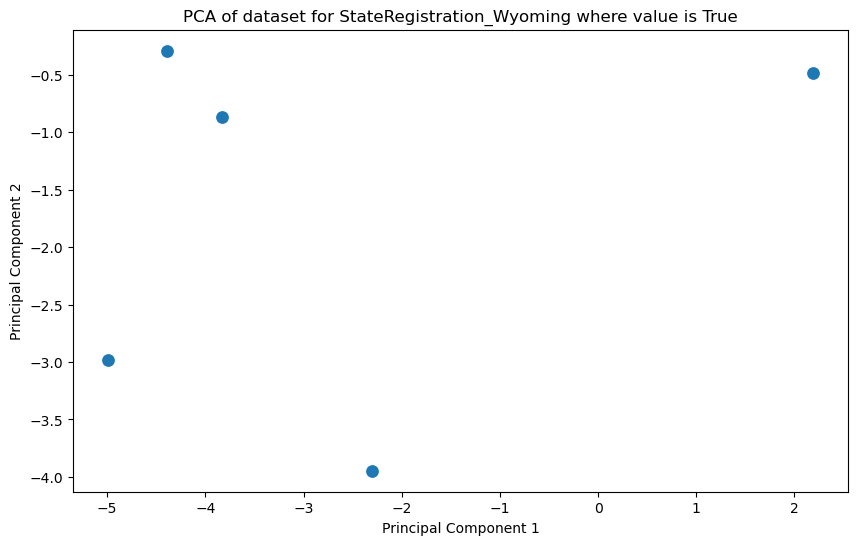

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# List of all columns in your dataset
all_columns = train_data.columns

# Filter columns containing 'StateRegistration'
state_columns = [col for col in all_columns if 'StateRegistration' in col]

pca_df[state_columns] = train_data[state_columns].values

# Loop through each state column to generate a separate plot
for state_col in state_columns:
    if state_col in train_data.columns:  # Check if the column exists in the data
        plt.figure(figsize=(10, 6))

        # Filter data where the state column is True
        state_data = pca_df[pca_df[state_col] == True]

        # Plotting the data (no age grouping, just the data points)
        sns.scatterplot(x=state_data['PC1'], y=state_data['PC2'], s=100, marker='o')

        # Title and labels
        plt.title(f'PCA of dataset for {state_col} where value is True')
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')

        # Show plot
        plt.show()



In [112]:
import matplotlib.pyplot as plt

def analyze_trends(df, dict_time_series, swing_voter_filter=False): 
    """
    Analyze trends for each column in the dictionary using the Year column for grouping.
    This version fixes layout issues and handles one-hot encoded columns that may be missing a category.
    
    Parameters:
        df (pd.DataFrame): Input DataFrame with the data.
        dict_time_series (pd.DataFrame): DataFrame defining columns and their types.

    Returns:
        None: Visualizes trends for each column over time with standardized plot size and layout.
    """
    # Ensure the "Year" column exists for grouping
    time_column = dict_time_series.loc["VCF0004"]["column"]  # "Year"
    if time_column not in df.columns:
        raise ValueError(f"Time column '{time_column}' not found in DataFrame.")
        
    # Apply swing voter filter if specified
    if swing_voter_filter:
        if "swing_voter" not in df.columns:
            raise ValueError("The `swing_voter` column is not found in the DataFrame.")
        df = df[df["swing_voter"] == True]

    # Get the unique years for the x-axis limits
    unique_years = sorted(df[time_column].unique())

    # Standardized plot size (width, height) in inches
    plot_width = 12
    plot_height = 8

    # Iterate over each row in the DataFrame (i.e., the metadata for each entry)
    for idx, row in dict_time_series.iterrows():
        column_name = row["column"]
        column_type = row["type"]

        # Skip the time column itself
        if column_name == time_column:
            continue

        if column_type == "cat":
            # Handle categorical (one-hot encoded) columns
            category_prefix = column_name  # Prefix for one-hot encoding
            matching_columns = [col for col in df.columns if col.startswith(category_prefix)]

            if not matching_columns:
                print(f"No one-hot encoded columns found for '{column_name}'.")
                continue

            # If only one matching column exists, handle it separately
            if len(matching_columns) == 1:
                # No need to normalize since there is only one category (True/False)
                trend = df.groupby(time_column)[matching_columns[0]].sum()
                trend_percentage = (trend / df.groupby(time_column).size()) * 100
                
            else:
                # Aggregate one-hot encoded columns by year as percentages
                trend = df.groupby(time_column)[matching_columns].sum()

                # Ensure both True and False categories are reflected, even if one is missing
                if 'True' in matching_columns:
                    missing_column = [col for col in matching_columns if col != 'True'][0]
                    trend[missing_column] = trend[missing_column].fillna(0)
                else:
                    # Add a 'True' column if it doesn't exist
                    trend['True'] = 0

                # Normalize to percentages (considering both True and False categories)
                trend_percentage = trend.div(trend.sum(axis=1), axis=0) * 100

            # Plot the trend with standardized size and x-axis
            plt.figure(figsize=(plot_width, plot_height))
            trend_percentage.plot(ax=plt.gca(), kind="line", linewidth=2)

            plt.title(f"Percentage Trend for {column_name} (Categorical)", fontsize=14)
            plt.xlabel("Year", fontsize=12)
            plt.ylabel("Percentage (%)", fontsize=12)
            plt.xticks(unique_years, rotation=45, fontsize=10)  # Consistent x-axis labels
            plt.yticks(fontsize=10)
            plt.legend(
                title="Categories", 
                bbox_to_anchor=(1.05, 1), 
                loc="upper left", 
                fontsize=10
            )
            plt.tight_layout()  # Adjust layout to prevent overlap
            plt.show()

In [96]:
dict_time_series.index

Index(['VCF0004', 'VCF0104', 'VCF0302', 'VCF0656', 'VCF0870', 'VCF0838',
       'VCF0101', 'VCF0110', 'VCF0114', 'VCF0105a', 'VCF0112', 'VCF0806',
       'VCF0702', 'VCF0704'],
      dtype='object')

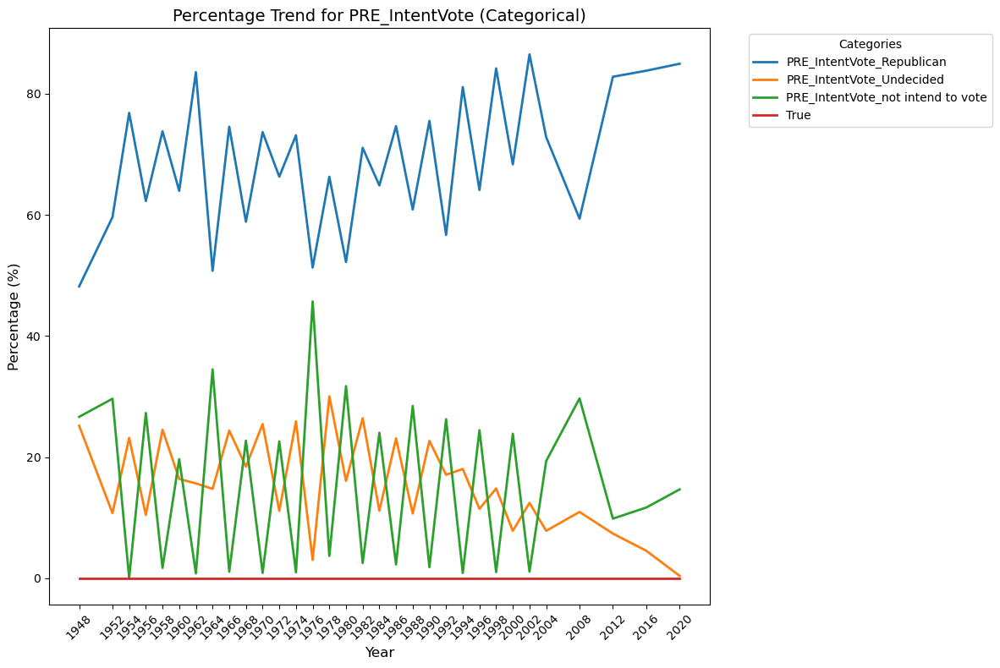

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


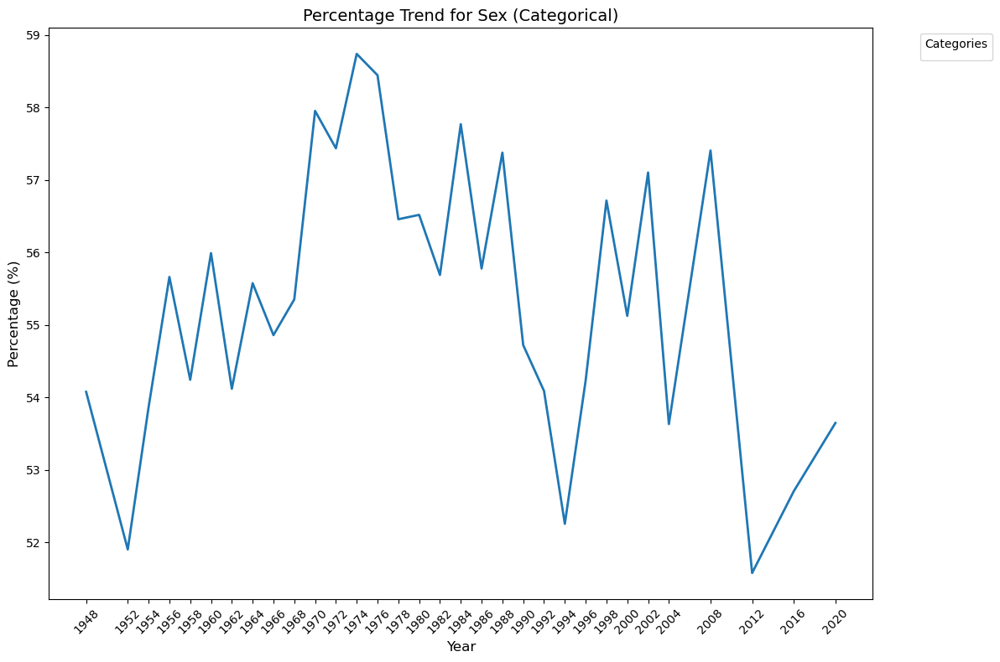

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


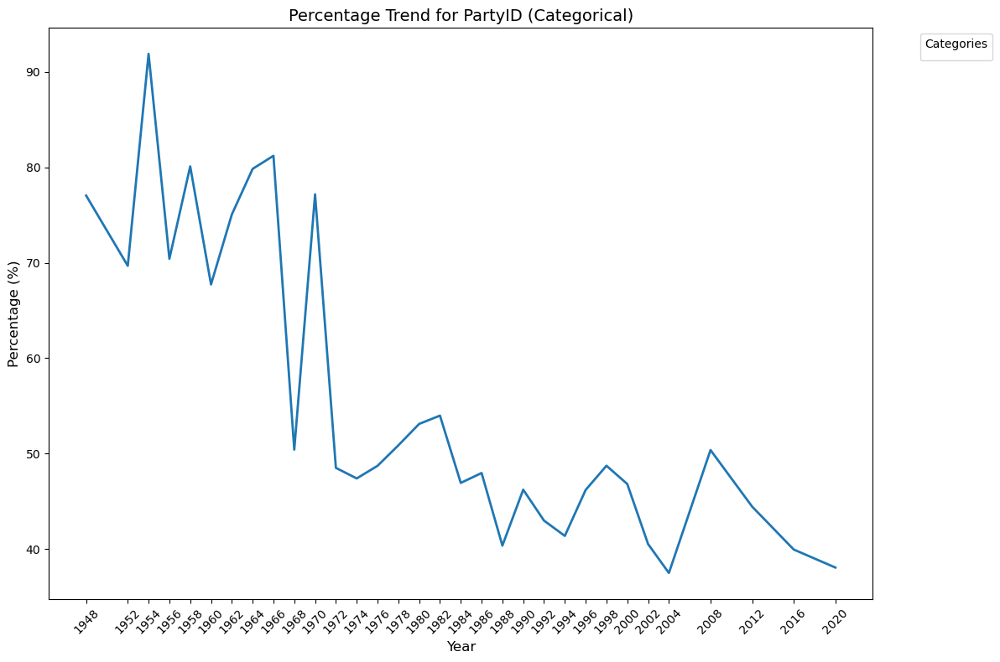

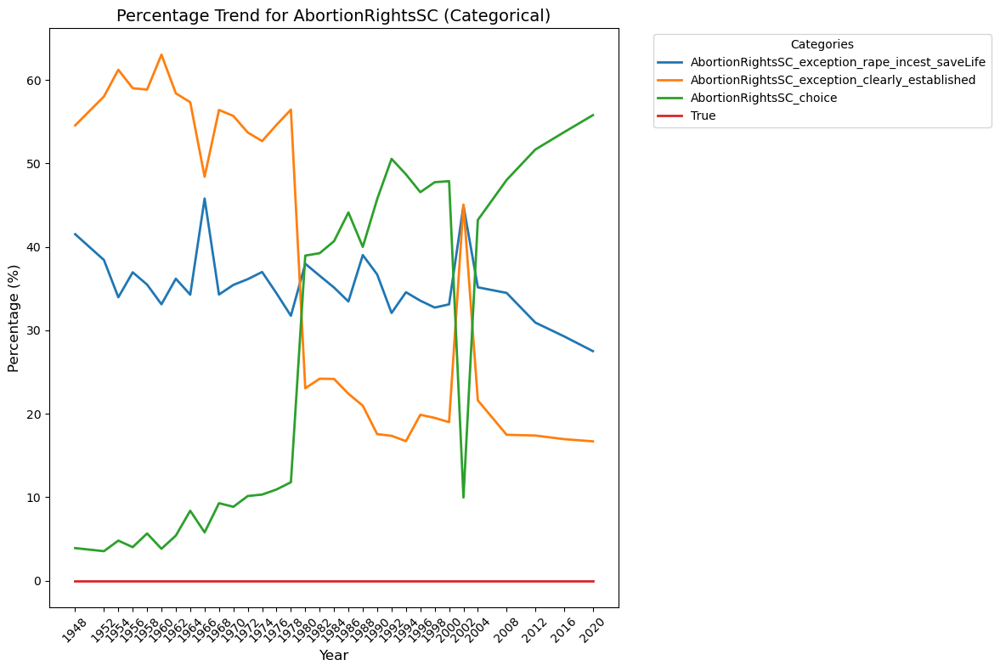

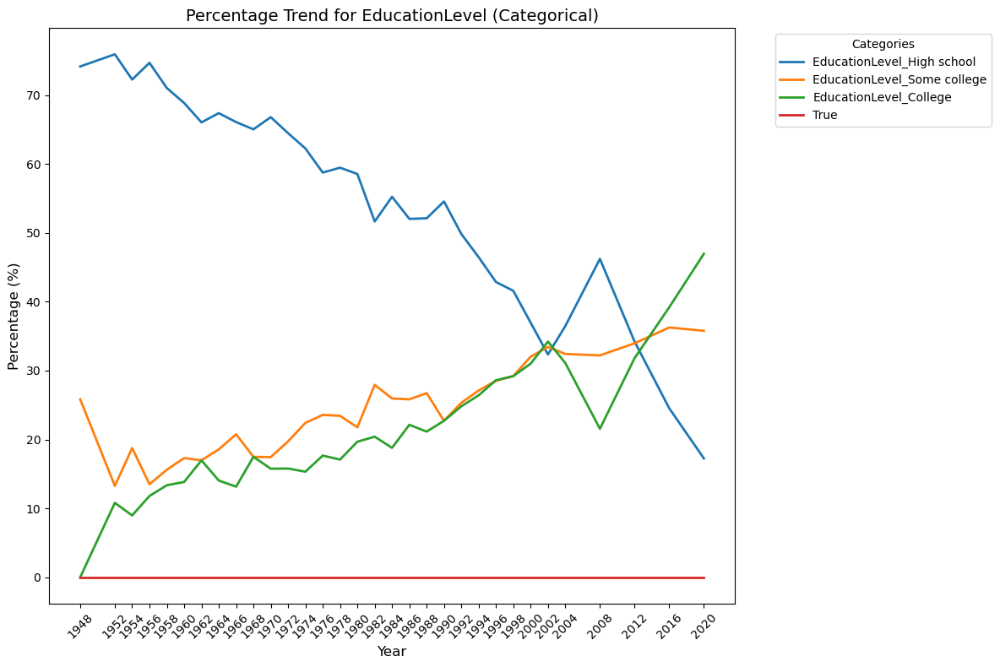

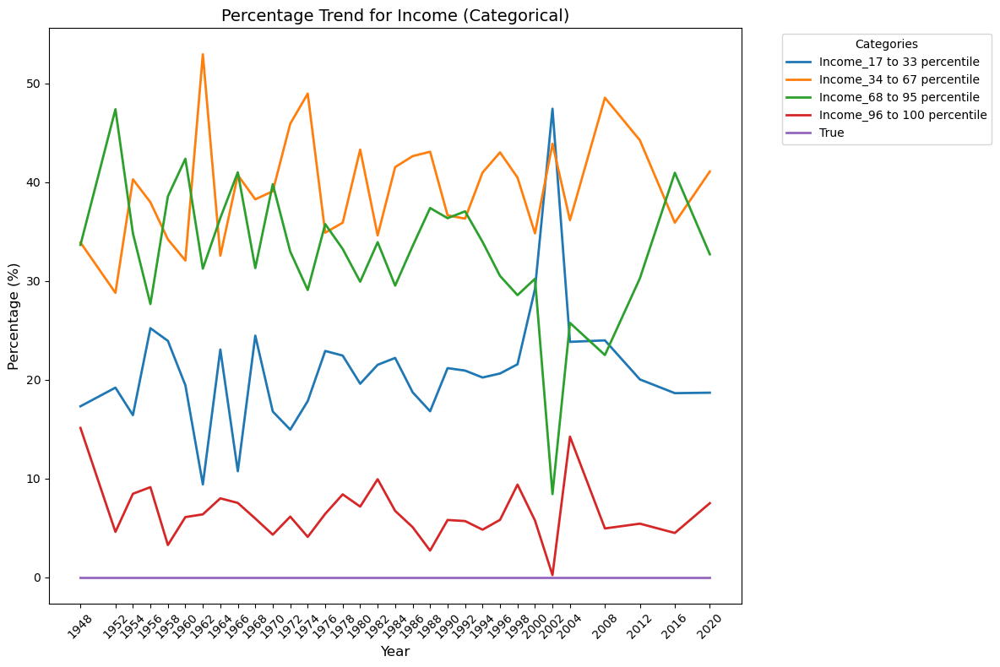

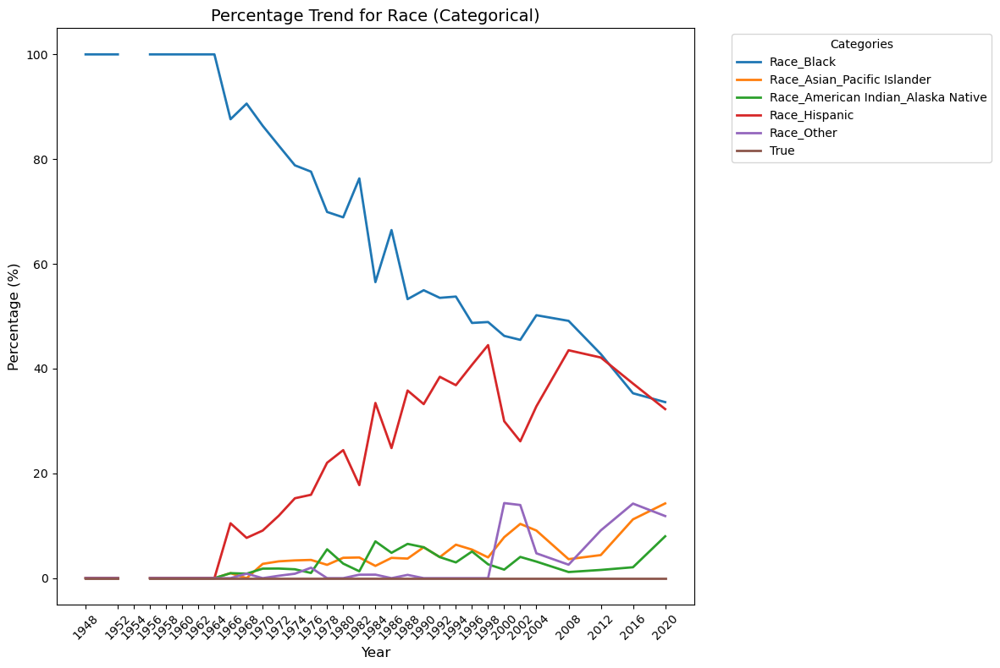

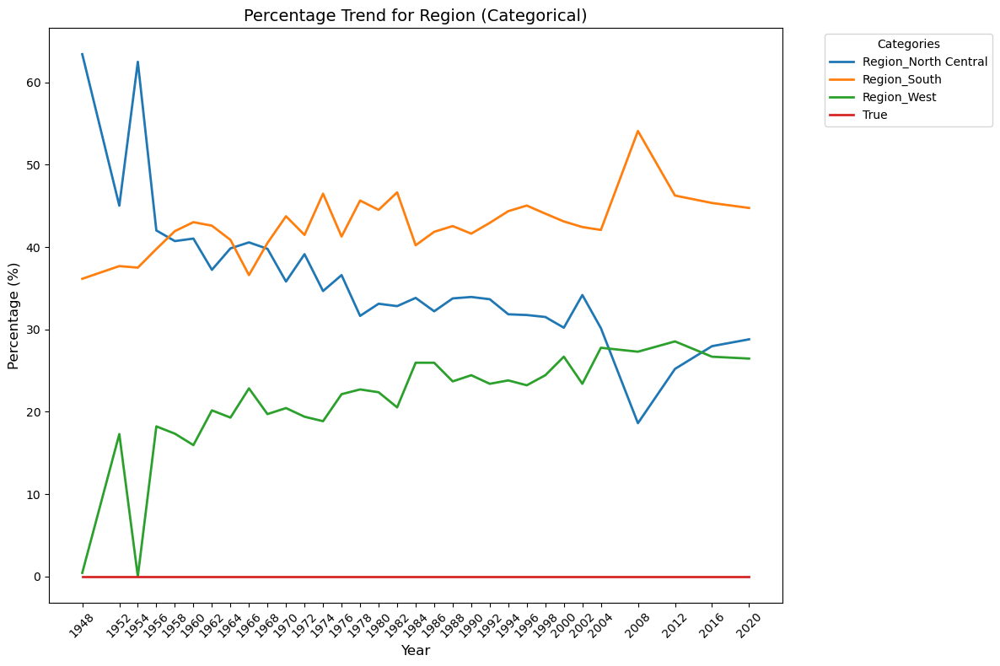

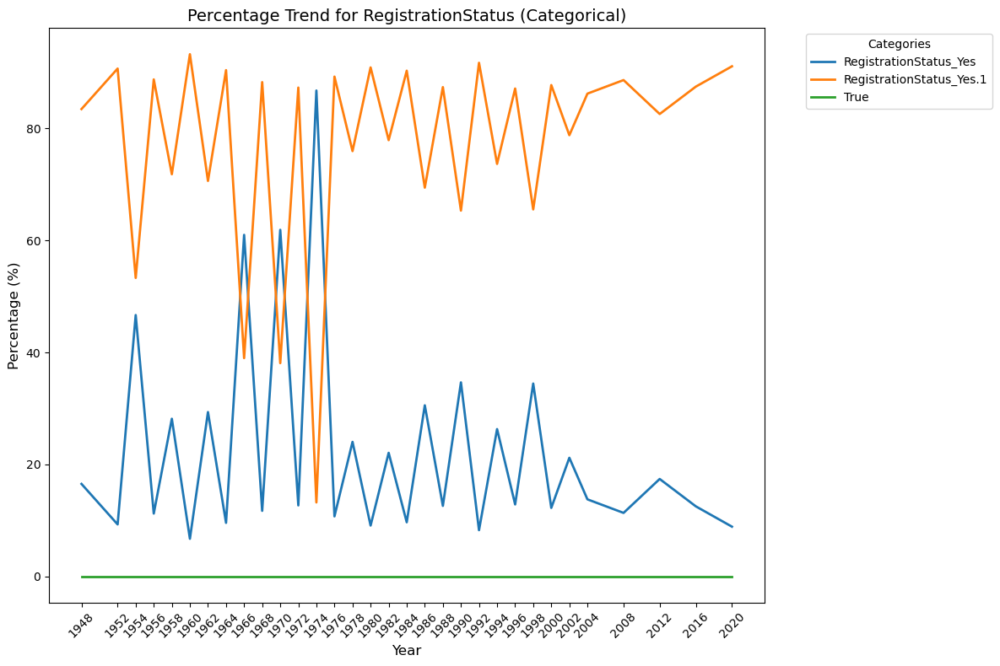

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


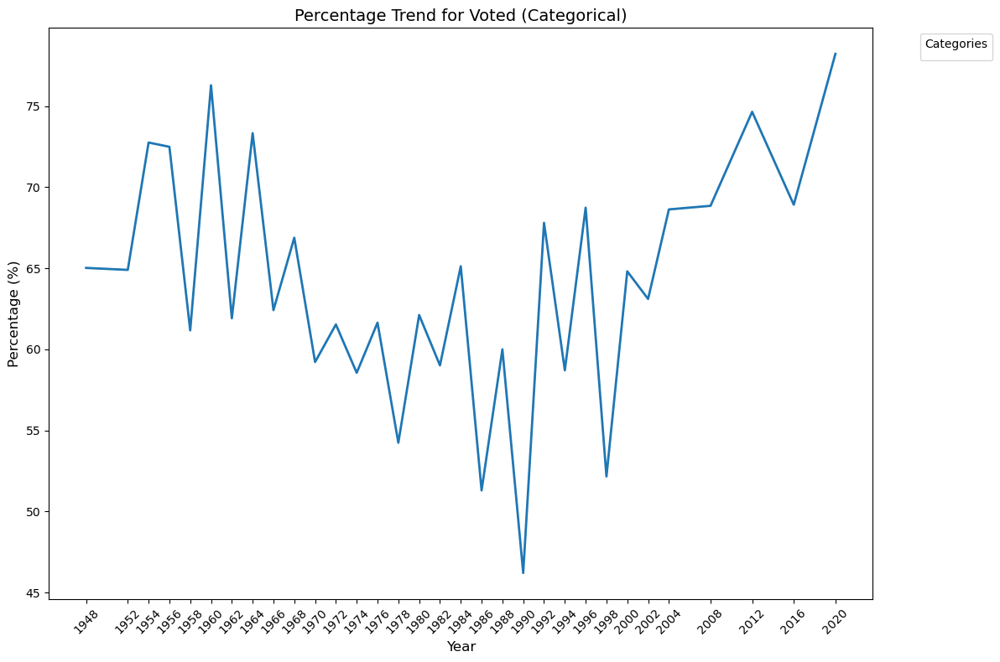

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


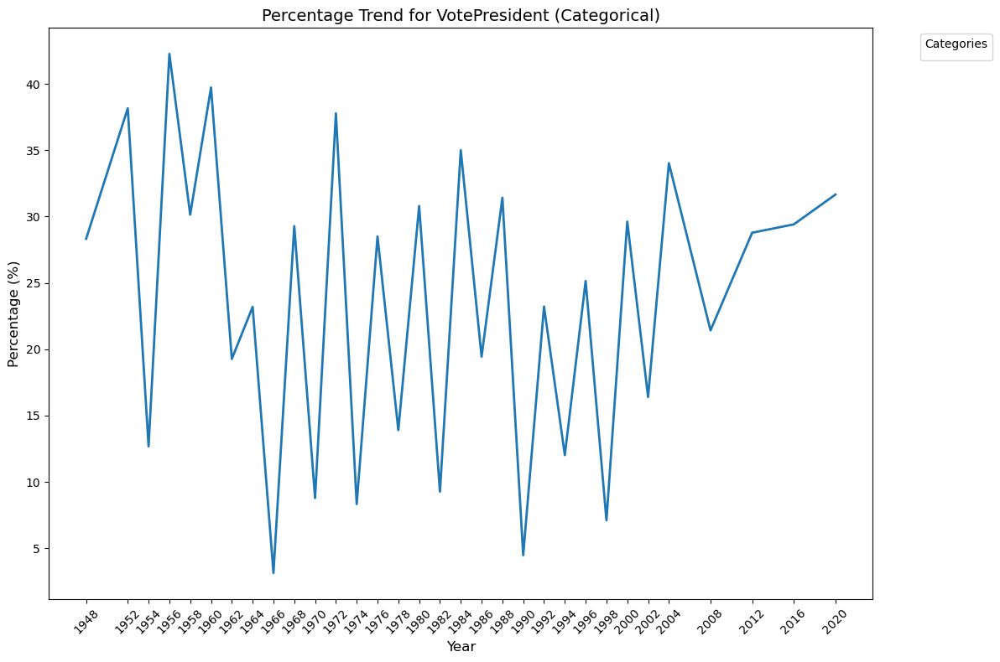

In [113]:
analyze_trends(train_time_data, dict_time_series)

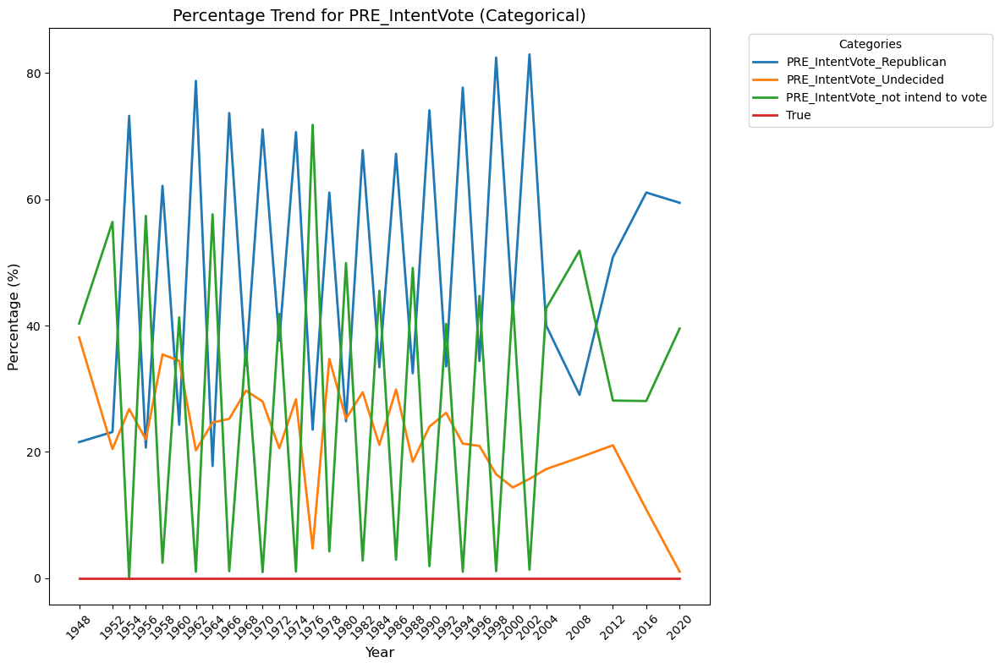

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


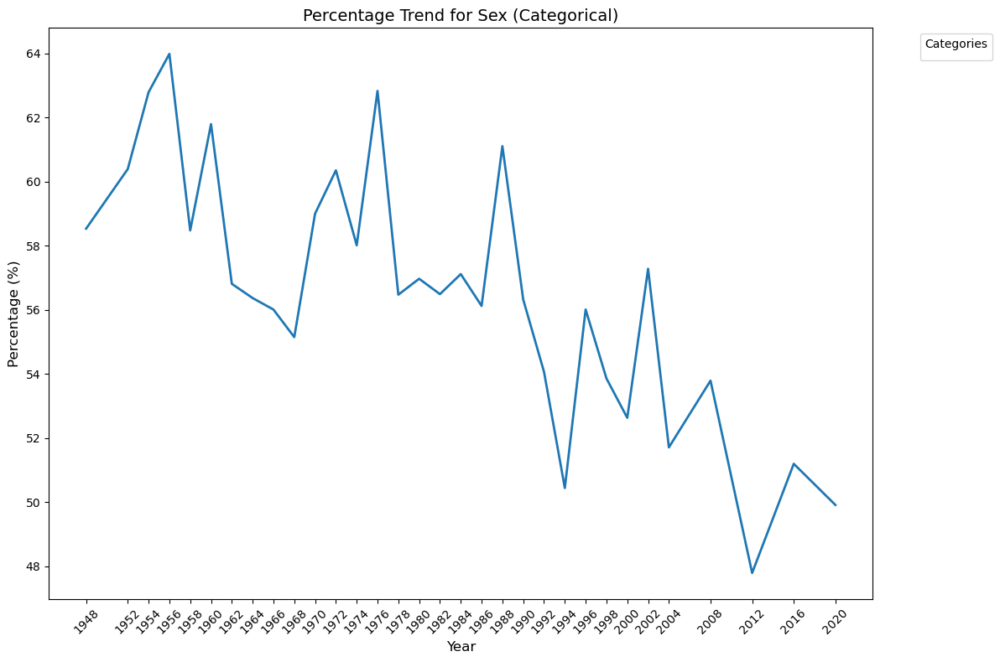

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


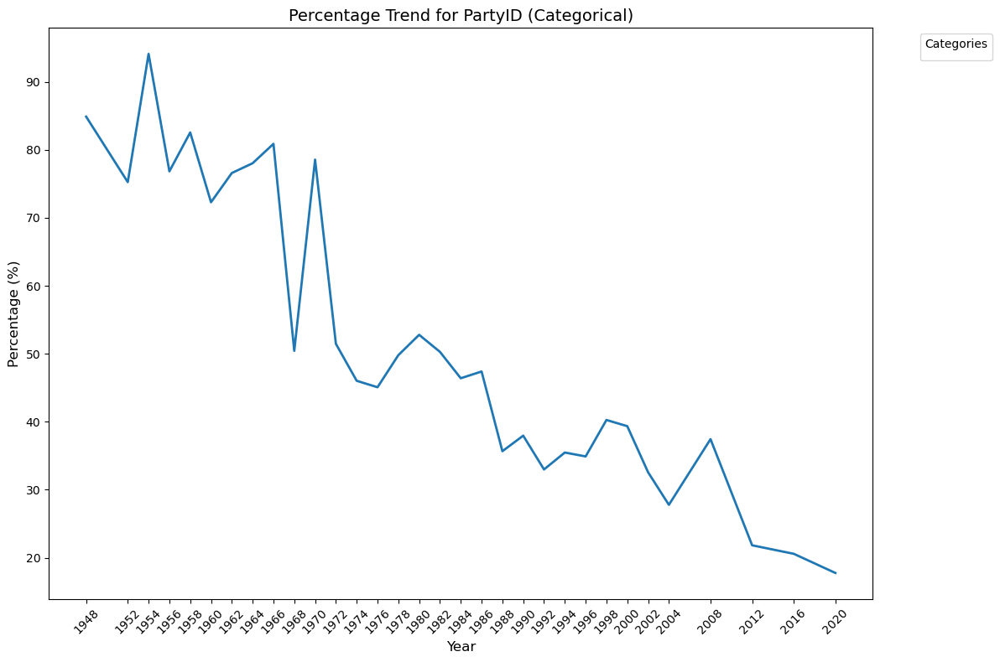

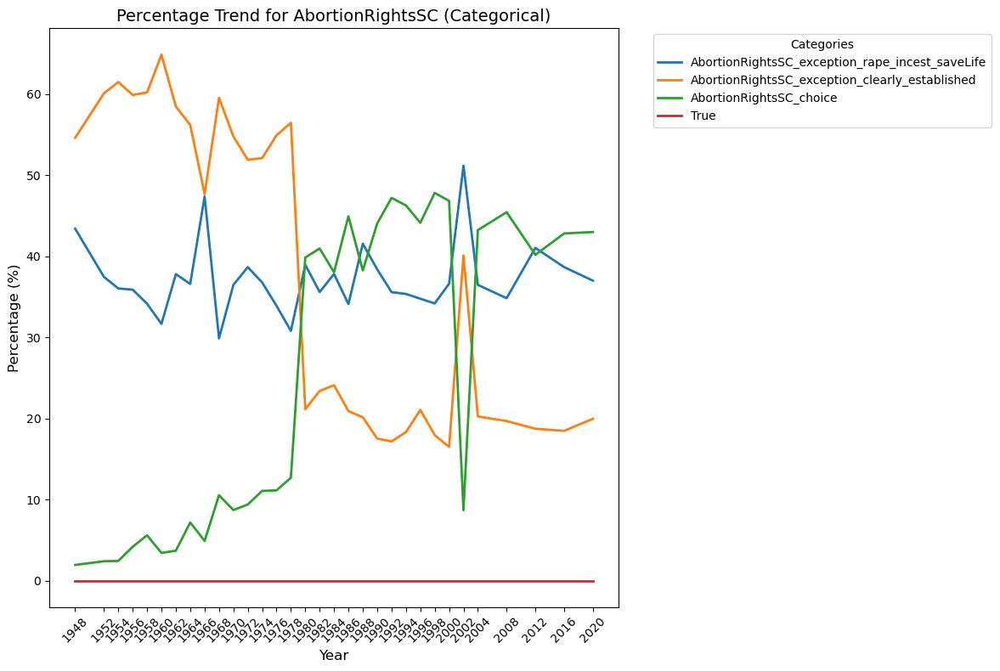

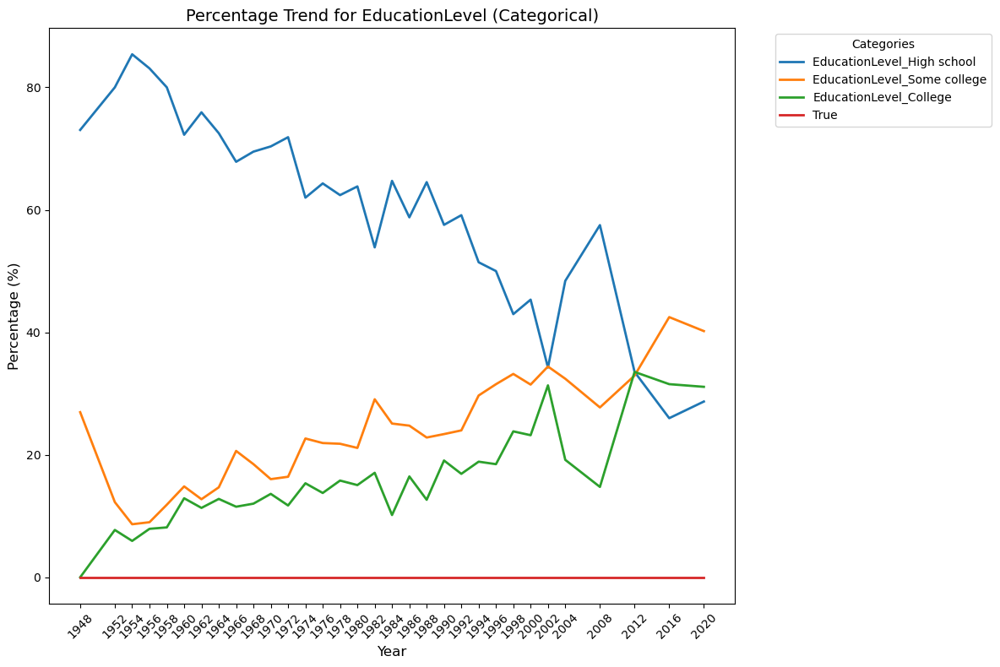

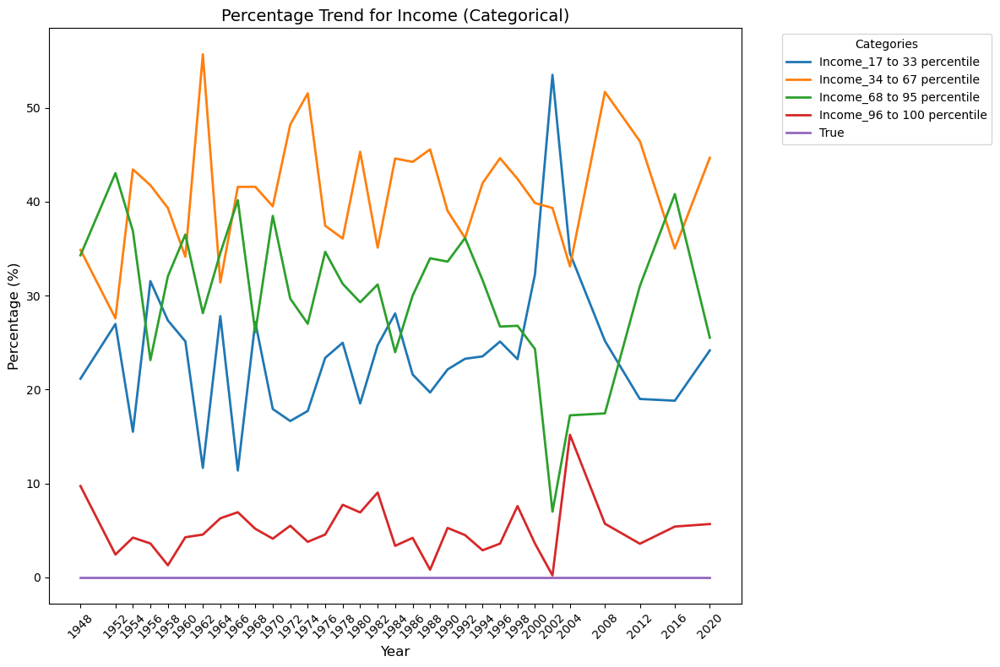

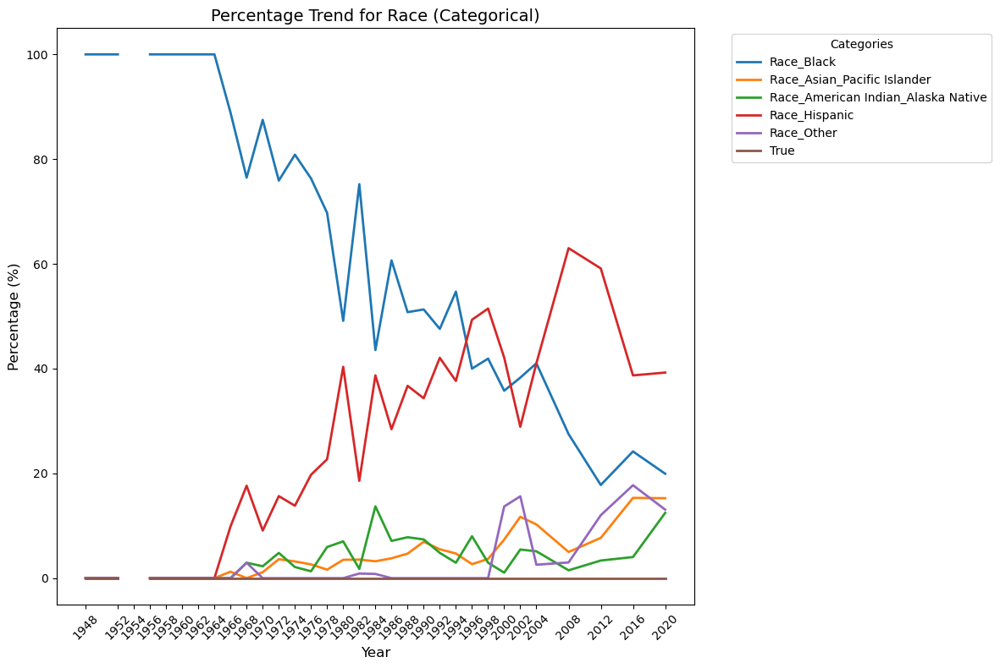

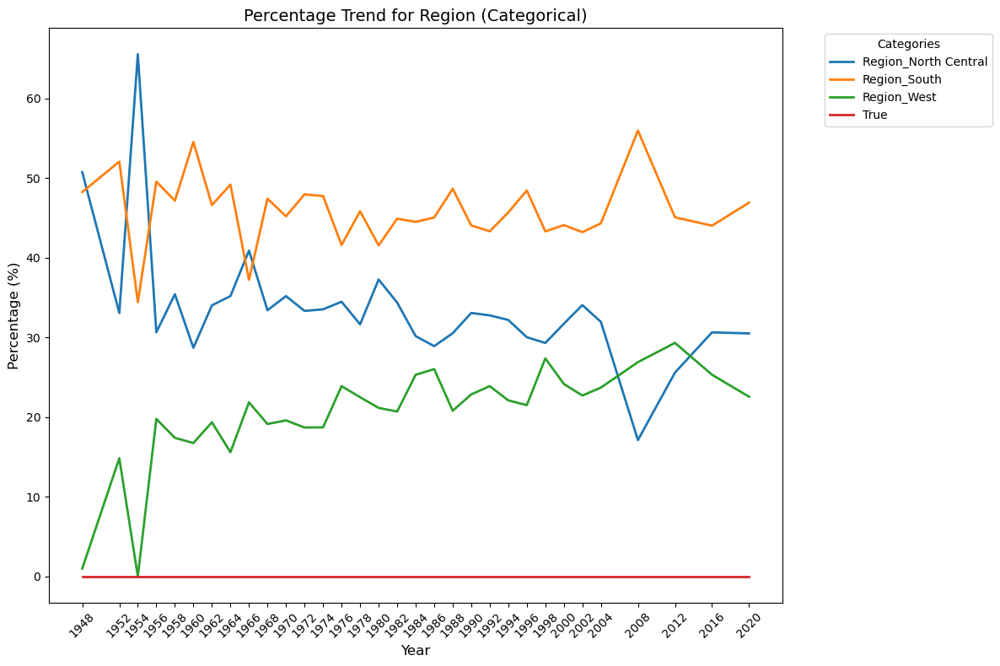

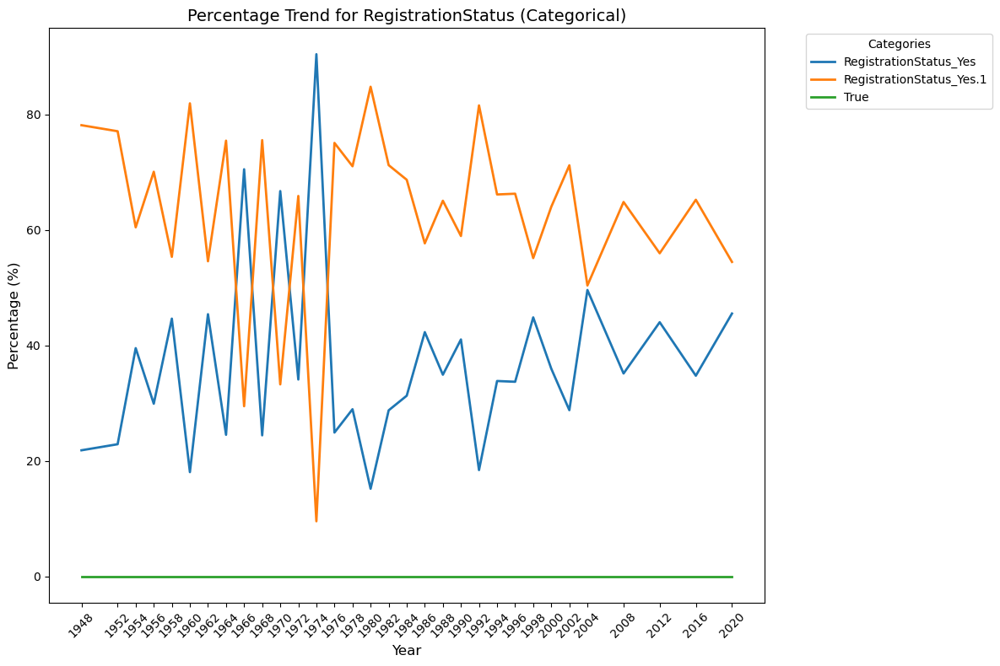

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


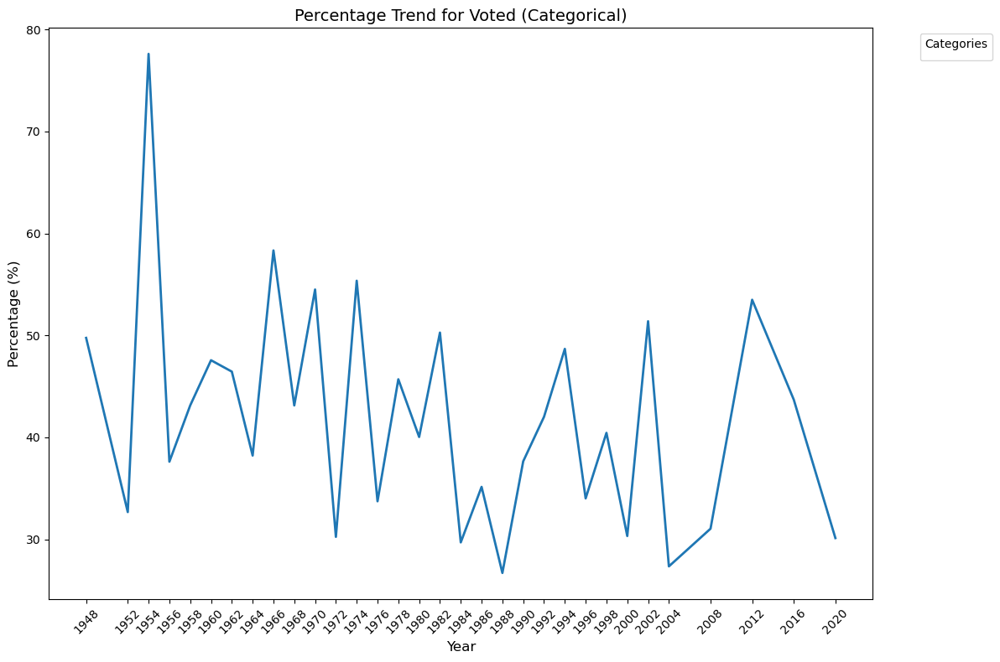

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


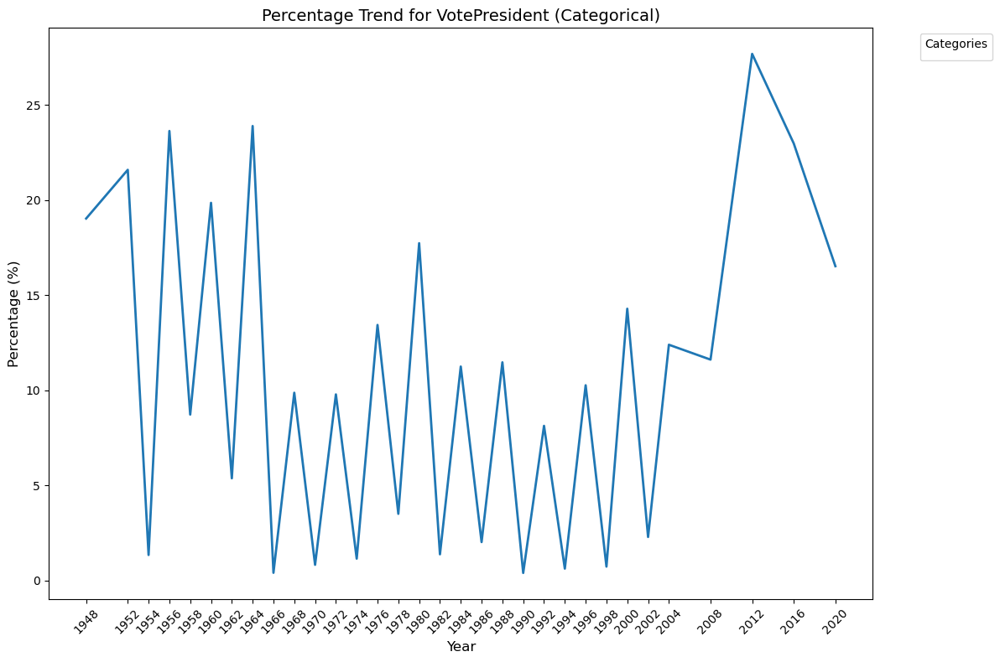

In [114]:
analyze_trends(train_time_data, dict_time_series, True)

In [105]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

def analyze_difference_trends(df, dict_time_series, swing_voter_filter=False): 
    """
    Analyze the difference in trends for each column between overall voters and swing voters.
    This version ensures a 0 line is always drawn, and different categories are color-coded based on the column's categories.

    Parameters:
        df (pd.DataFrame): Input DataFrame with the data.
        dict_time_series (pd.DataFrame): DataFrame defining columns and their types.
        swing_voter_filter (bool): Whether to filter for swing voters or not. Defaults to False.

    Returns:
        None: Visualizes the difference in trends between swing voters and overall population over time.
    """
    # Ensure the "Year" column exists for grouping
    time_column = dict_time_series.loc["VCF0004"]["column"]  # "Year"
    if time_column not in df.columns:
        raise ValueError(f"Time column '{time_column}' not found in DataFrame.")
        
    # Get the unique years for the x-axis limits
    unique_years = sorted(df[time_column].unique())

    # Standardized plot size (width, height) in inches
    plot_width = 12
    plot_height = 8

    # Define a color palette for categories (using seaborn's color palette)
    color_palette = sns.color_palette("Set2")  # Choose a color palette

    # Iterate over each row in the DataFrame (i.e., the metadata for each entry)
    for idx, row in dict_time_series.iterrows():
        column_name = row["column"]
        column_type = row["type"]

        # Skip the time column itself
        if column_name == time_column:
            continue

        if column_type == "cat":
            # Handle categorical (one-hot encoded) columns
            category_prefix = column_name  # Prefix for one-hot encoding
            matching_columns = [col for col in df.columns if col.startswith(category_prefix)]

            if not matching_columns:
                print(f"No one-hot encoded columns found for '{column_name}'.")
                continue

            # Function to calculate the trend for both overall and swing voters
            def calculate_trend(data):
                if len(matching_columns) == 1:
                    # No need to normalize since there is only one category (True/False)
                    trend = data.groupby(time_column)[matching_columns[0]].sum()
                    trend_percentage = (trend / data.groupby(time_column).size()) * 100
                else:
                    # Aggregate one-hot encoded columns by year as percentages
                    trend = data.groupby(time_column)[matching_columns].sum()

                    # Normalize to percentages (considering all categories)
                    trend_percentage = trend.div(trend.sum(axis=1), axis=0) * 100

                return trend_percentage

            # Calculate trends for overall and swing voters
            overall_trend_percentage = calculate_trend(df)  # Overall trend
            swing_voter_trend_percentage = calculate_trend(df[df['swing_voter'] == True])  # Swing voter trend

            # Calculate the difference between the two trends
            trend_difference = swing_voter_trend_percentage - overall_trend_percentage

            # Plotting the difference between trends for both overall and swing voters
            plt.figure(figsize=(plot_width, plot_height))

            # Iterate over each category (for multi-category trends)
            for idx, category in enumerate(overall_trend_percentage.columns):
                # Plot the trend for each category for overall and swing voters
                plt.plot(overall_trend_percentage.index, overall_trend_percentage[category], 
                         label=f'Overall {category}', color=color_palette[idx], linewidth=2)
                plt.plot(swing_voter_trend_percentage.index, swing_voter_trend_percentage[category], 
                         label=f'Swing Voter {category}', color=color_palette[idx], linestyle='--', linewidth=2)

            # Plot the difference trend
            plt.plot(trend_difference.index, trend_difference.mean(axis=1), 
                     label="Difference (Swing vs. Overall)", color='purple', linewidth=3, linestyle=':')

            # Draw a horizontal line at 0 to indicate the neutral line
            plt.axhline(0, color='black', linestyle='--', linewidth=1)

            # Plot customization
            plt.title(f"Difference in Trend for {column_name} (Swing Voter vs. Overall)", fontsize=14)
            plt.xlabel("Year", fontsize=12)
            plt.ylabel("Percentage (%)", fontsize=12)
            plt.xticks(unique_years, rotation=45, fontsize=10)  # Consistent x-axis labels
            plt.yticks(fontsize=10)
            plt.legend(title="Trend Difference", loc="upper left", fontsize=10)
            plt.tight_layout()  # Adjust layout to prevent overlap
            plt.show()


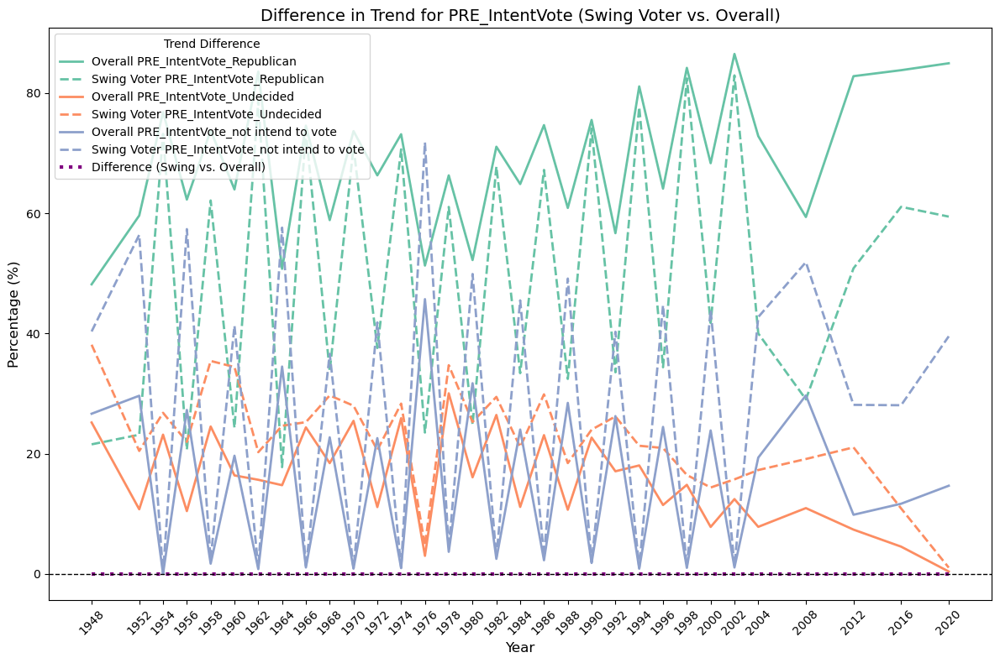

AttributeError: 'Series' object has no attribute 'columns'

<Figure size 1200x800 with 0 Axes>

In [123]:
analyze_difference_trends(train_time_data, dict_time_series, True)

In [3]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

def analyze_difference_trends(df, dict_time_series, swing_voter_filter=False): 
    """
    Analyze the difference in trends between overall voters and swing voters for each column,
    focusing only on the differences. For multi-category trends, each category has its own line.

    Parameters:
        df (pd.DataFrame): Input DataFrame with the data.
        dict_time_series (pd.DataFrame): DataFrame defining columns and their types.
        swing_voter_filter (bool): Whether to filter for swing voters or not. Defaults to False.

    Returns:
        None: Visualizes the difference in trends between swing voters and overall population over time.
    """
    # Ensure the "Year" column exists for grouping
    time_column = dict_time_series.loc["VCF0004"]["column"]  # "Year"
    if time_column not in df.columns:
        raise ValueError(f"Time column '{time_column}' not found in DataFrame.")
        
    # Get the unique years for the x-axis limits
    unique_years = sorted(df[time_column].unique())

    # Standardized plot size (width, height) in inches
    plot_width = 12
    plot_height = 8

    # Define a color palette for categories (using seaborn's color palette)
    color_palette = sns.color_palette("Set2")  # Choose a color palette

    # Iterate over each row in the DataFrame (i.e., the metadata for each entry)
    for idx, row in dict_time_series.iterrows():
        column_name = row["column"]
        column_type = row["type"]

        # Skip the time column itself
        if column_name == time_column:
            continue

        if column_type == "cat":
            # Handle categorical (one-hot encoded) columns
            category_prefix = column_name  # Prefix for one-hot encoding
            matching_columns = [col for col in df.columns if col.startswith(category_prefix)]

            if not matching_columns:
                print(f"No one-hot encoded columns found for '{column_name}'.")
                continue

            # Function to calculate the trend for both overall and swing voters
            def calculate_trend(data):
                if len(matching_columns) == 1:
                    # No need to normalize since there is only one category (True/False)
                    trend = data.groupby(time_column)[matching_columns[0]].sum()
                    trend_percentage = (trend / data.groupby(time_column).size()) * 100
                else:
                    # Aggregate one-hot encoded columns by year as percentages
                    trend = data.groupby(time_column)[matching_columns].sum()

                    # Normalize to percentages (considering all categories)
                    trend_percentage = trend.div(trend.sum(axis=1), axis=0) * 100

                return trend_percentage

            # Calculate trends for overall and swing voters
            overall_trend_percentage = calculate_trend(df)  # Overall trend
            swing_voter_trend_percentage = calculate_trend(df[df['swing_voter'] == True])  # Swing voter trend

            # Calculate the difference between the two trends
            trend_difference = swing_voter_trend_percentage - overall_trend_percentage

            # Plotting the difference between trends for both overall and swing voters
            plt.figure(figsize=(plot_width, plot_height))

            # If we have multiple categories, plot the difference for each category
            if isinstance(overall_trend_percentage, pd.DataFrame):
                for idx, category in enumerate(overall_trend_percentage.columns):
                    # Plot the difference for each category
                    plt.plot(trend_difference.index, trend_difference[category], 
                             label=f'Difference for {category}', color=color_palette[idx], linewidth=2)
            else:
                # If there's only one category, just plot the single difference
                plt.plot(trend_difference.index, trend_difference, 
                         label=f'Difference for {matching_columns[0]}', color=color_palette[0], linewidth=2)

            # Draw a horizontal line at 0 to indicate the neutral line
            plt.axhline(0, color='black', linestyle='--', linewidth=1)

            # Plot customization
            plt.title(f"Difference in Trend for {column_name} (Swing Voter vs. Overall)", fontsize=14)
            plt.xlabel("Year", fontsize=12)
            plt.ylabel("Difference in Percentage (%)", fontsize=12)
            plt.xticks(unique_years, rotation=45, fontsize=10)  # Consistent x-axis labels
            plt.yticks(fontsize=10)
            plt.legend(title="Categories", loc="upper left", fontsize=10)
            plt.tight_layout()  # Adjust layout to prevent overlap
            plt.show()


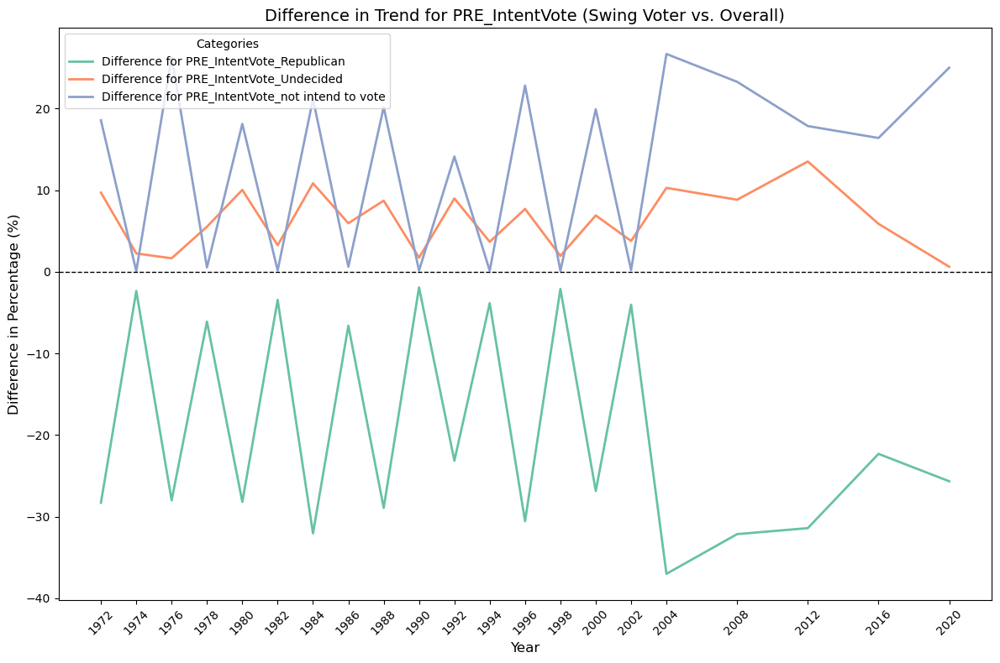

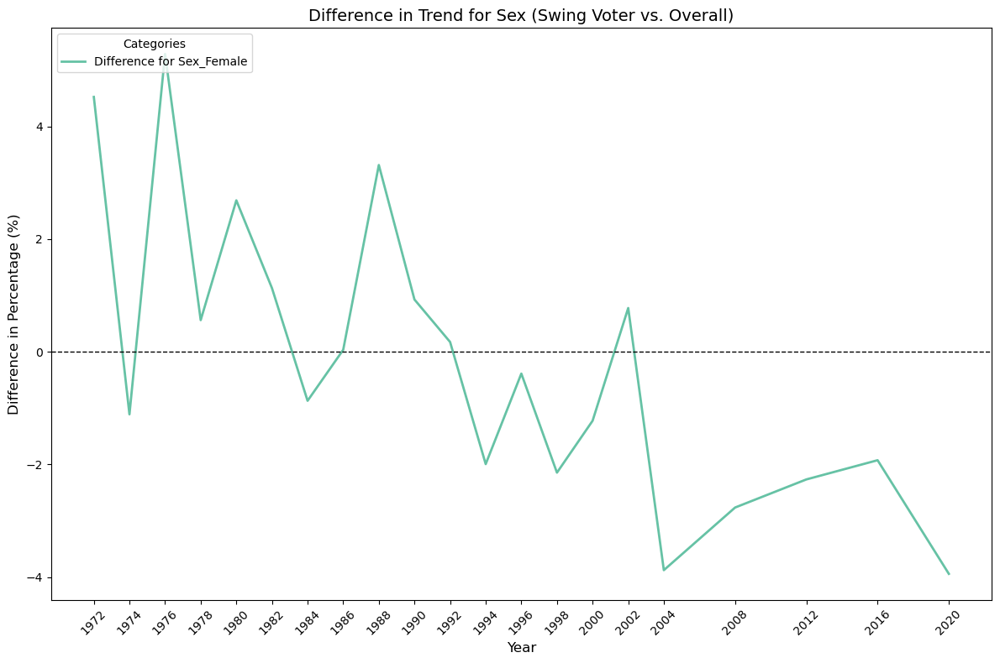

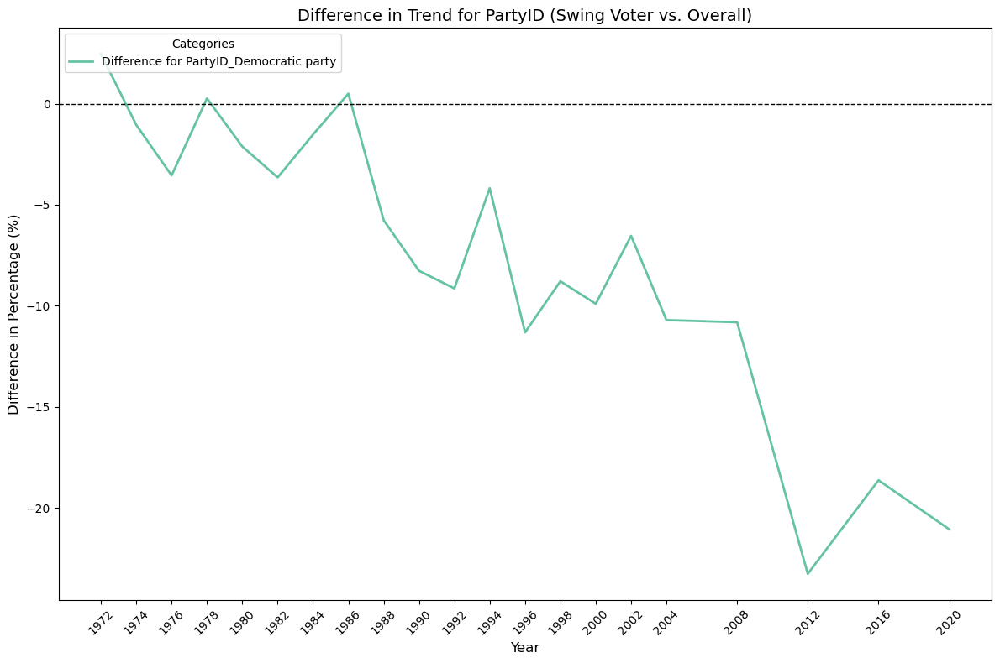

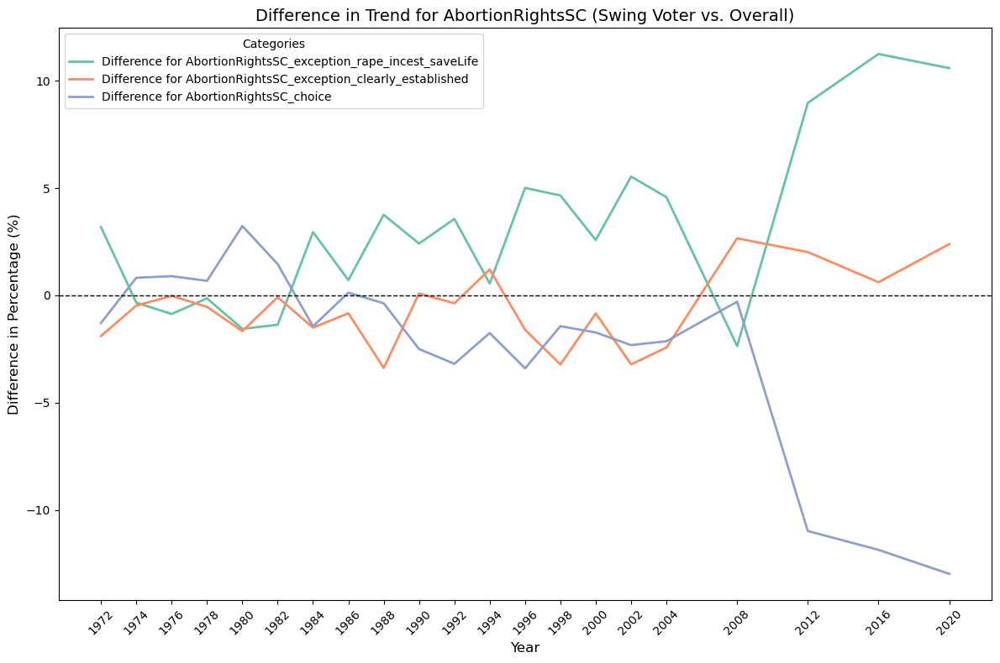

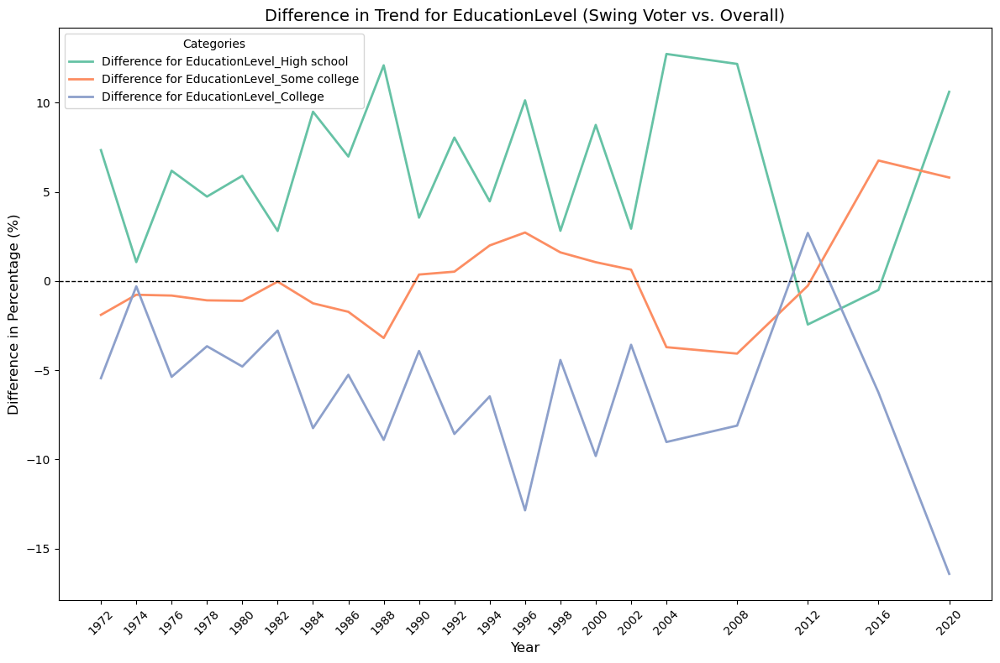

...

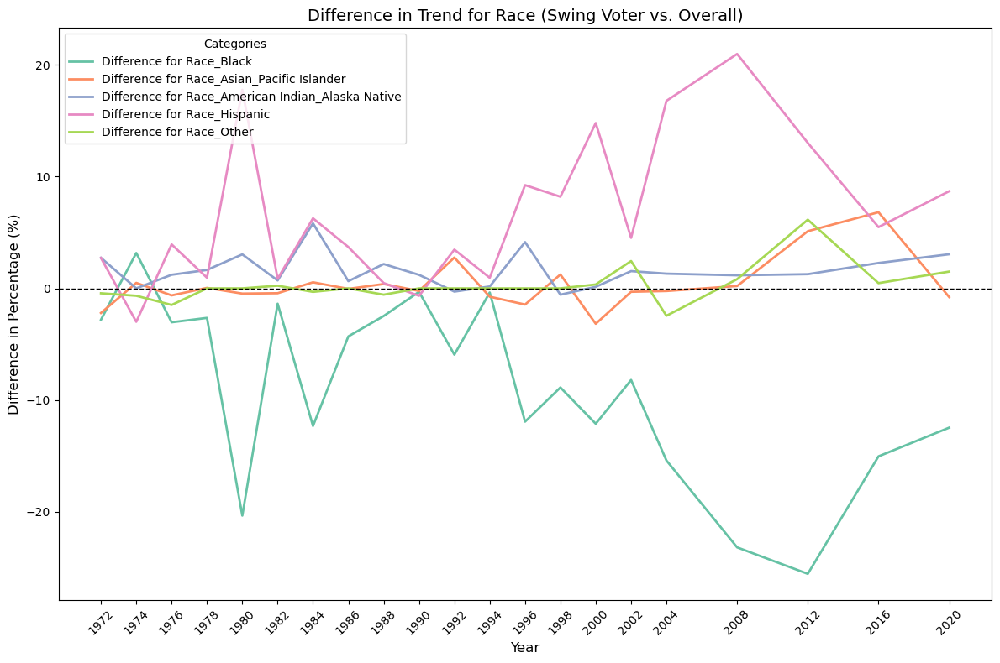

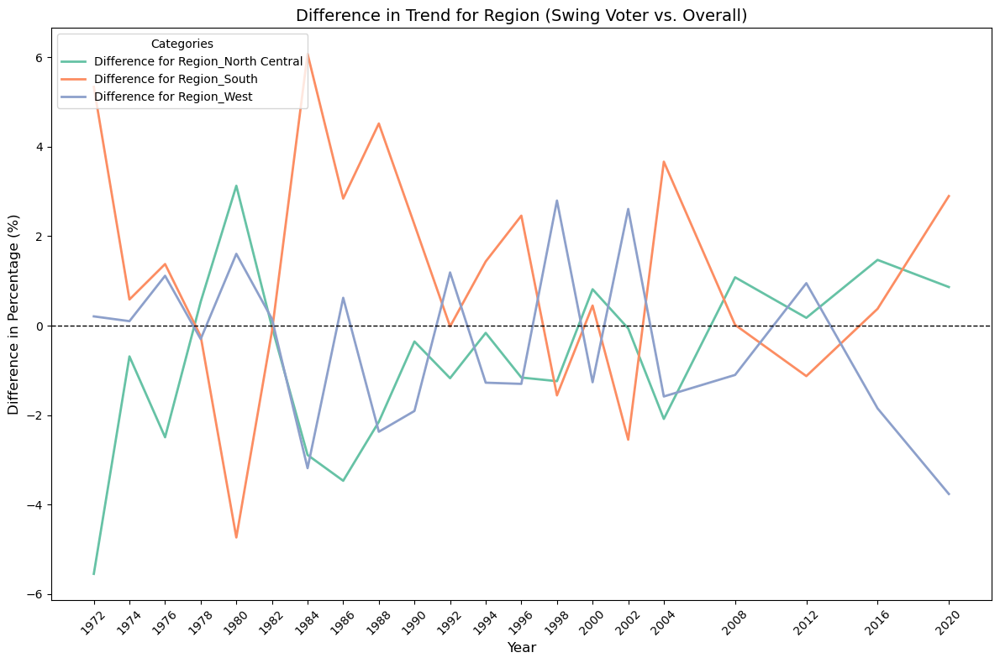

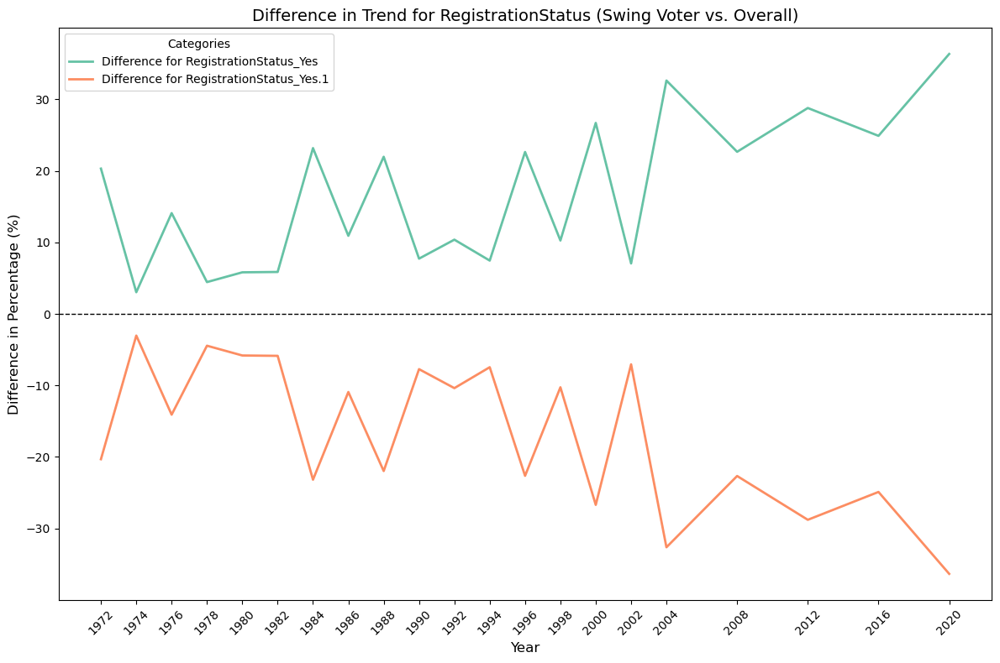

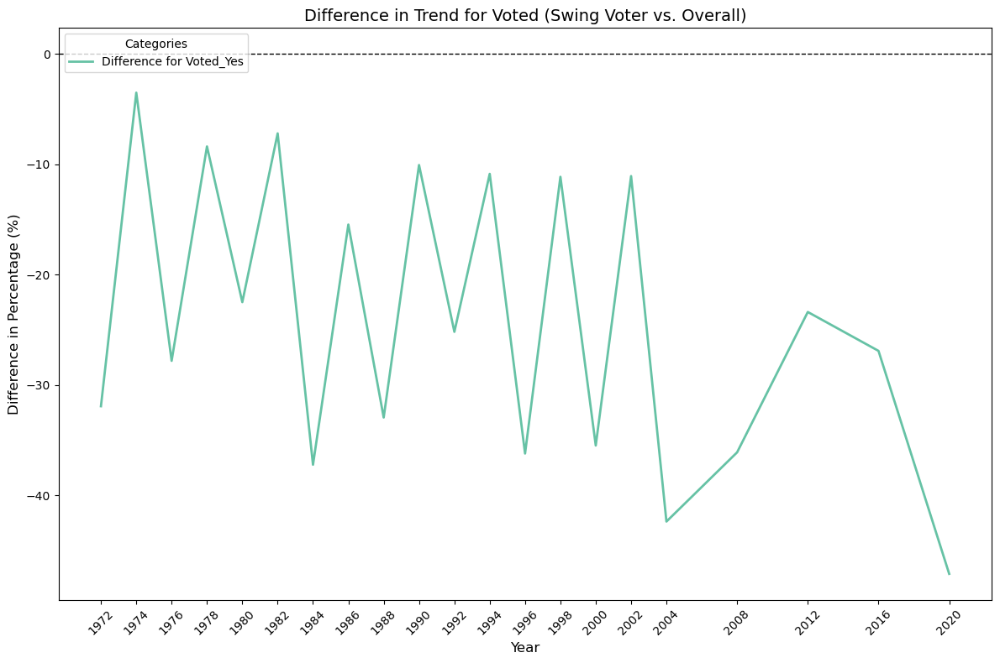

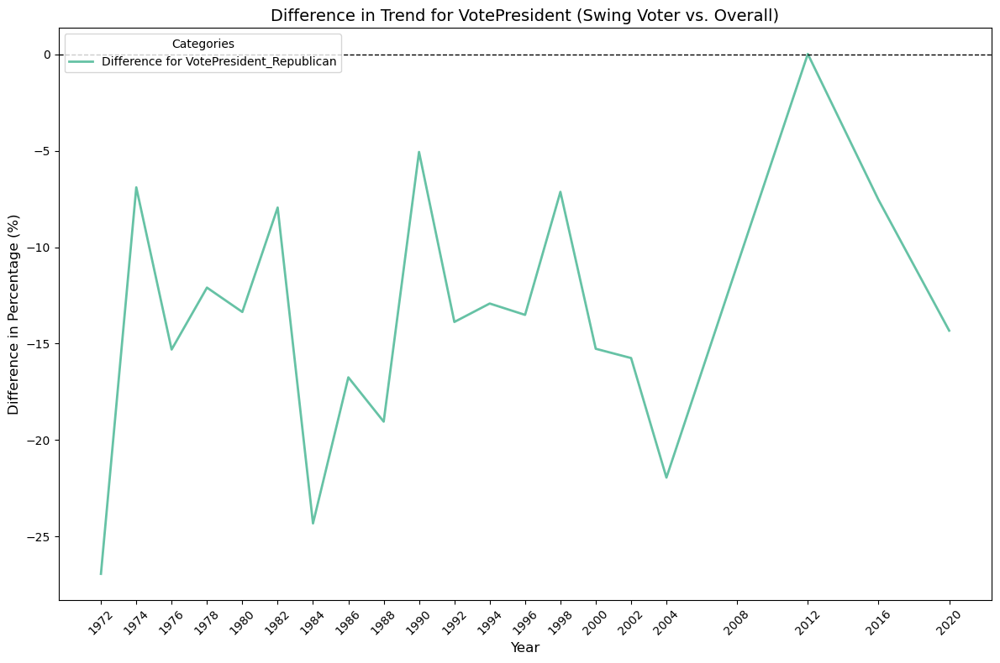

In [4]:
analyze_difference_trends(train_time_data, dict_time_series, True)

In [29]:
train_time_data.columns

Index(['incCrimeFedSpending', 'interestInElection', 'Year', 'PartyID',
       'ScaleSpendingServices', 'religiousAttendence', 'GovTrust',
       'EconomyView', 'Age', 'ScaleDefenseSpending', 'ScaleMedInsurance',
       'WomenRights', 'FedWasteTaxes', 'swing_voter',
       'PRE_IntentVote_Republican', 'PRE_IntentVote_Undecided',
       'PRE_IntentVote_not intend to vote', 'Sex_Female',
       'AbortionRightsSC_exception_rape_incest_saveLife',
       'AbortionRightsSC_exception_clearly_established',
       'AbortionRightsSC_choice', 'EducationLevel_High school',
       'EducationLevel_Some college', 'EducationLevel_College',
       'Income_17 to 33 percentile', 'Income_34 to 67 percentile',
       'Income_68 to 95 percentile', 'Income_96 to 100 percentile',
       'Race_Black', 'Race_Asian_Pacific Islander',
       'Race_American Indian_Alaska Native', 'Race_Hispanic', 'Race_Other',
       'Region_North Central', 'Region_South', 'Region_West',
       'RegistrationStatus_Yes', 'Voted_Yes'

In [2]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Select features to normalize (e.g., numerical columns only)
numerical_features = [dict_time_series.loc[col]["column"] for col in dict_time_series.index if dict_time_series.loc[col]["type"] == "rank" or dict_time_series.loc[col]["type"] == "num"]
print(numerical_features)
train_time_data[numerical_features] = scaler.fit_transform(train_time_data[numerical_features])
val_time_data[numerical_features] = scaler.transform(val_time_data[numerical_features])

['incCrimeFedSpending', 'interestInElection', 'Year', 'PartyID', 'ScaleSpendingServices', 'religiousAttendence', 'GovTrust', 'EconomyView', 'Age', 'ScaleDefenseSpending', 'ScaleMedInsurance', 'WomenRights', 'FedWasteTaxes']


In [3]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LogisticRegression, Ridge, Lasso
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.preprocessing import OneHotEncoder, scale, StandardScaler
import statsmodels.api as sm
from itertools import product
from joblib import Parallel, delayed
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)

y_train_time = train_time_data['swing_voter']
X_train_time = train_time_data.drop(['RegistrationStatus_Yes', 'Voted_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote',
        'swing_voter'],axis=1)

y_val_time = val_time_data['swing_voter']
X_val_time = val_time_data.drop(['RegistrationStatus_Yes', 'Voted_Yes',
       'VotePresident_Republican', 'PRE_IntentVote_Republican',
       'PRE_IntentVote_Undecided', 'PRE_IntentVote_not intend to vote',
        'swing_voter'],axis=1)

#from sklearn.preprocessing import PolynomialFeatures

'''poly = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
X_train_time_poly = poly.fit_transform(X_train_time)
X_val_time_poly = poly.transform(X_val_time)'''


ls_all_fit = LogisticRegression(class_weight='balanced', random_state=42, penalty='l2', C=10, solver='liblinear')
ls_all_fit.fit(X=X_train_time,
               y=y_train_time)

ls_all_val_pred = ls_all_fit.predict(X=X_val_time_poly)

In [4]:
print("Confusion Matrix:\n", confusion_matrix(val_time_data['swing_voter'], ls_all_val_pred))
print("Accuracy:", accuracy_score(val_time_data['swing_voter'], ls_all_val_pred))
print("Classification Report:\n", classification_report(val_time_data['swing_voter'], ls_all_val_pred))

Confusion Matrix:
 [[3261 1554]
 [ 933 2188]]
Accuracy: 0.6866179435483871
Classification Report:
               precision    recall  f1-score   support

       False       0.78      0.68      0.72      4815
        True       0.58      0.70      0.64      3121

    accuracy                           0.69      7936
   macro avg       0.68      0.69      0.68      7936
weighted avg       0.70      0.69      0.69      7936



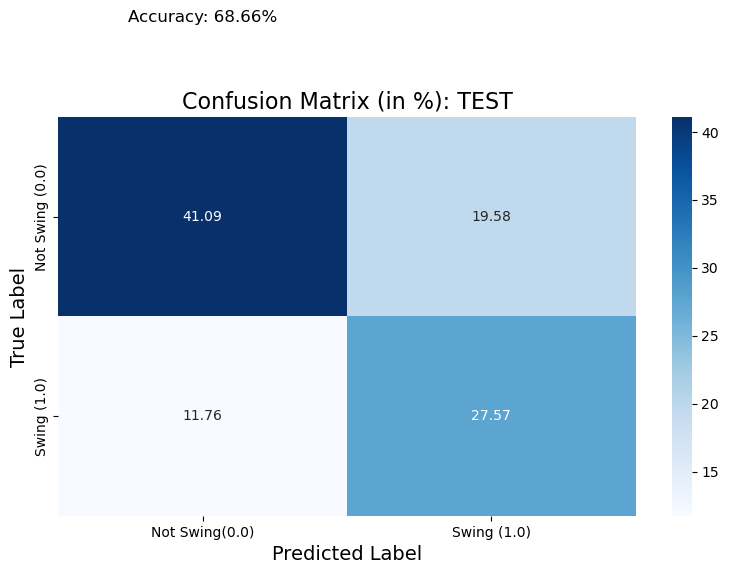

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate confusion matrix and normalize it to percentages
cm_values = confusion_matrix(val_time_data['swing_voter'], ls_all_val_pred) / val_time_data['swing_voter'].shape[0] * 100

# Create the confusion matrix plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_values, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): TEST', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values[0, 0] + cm_values[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

In [11]:
from catboost import CatBoostClassifier

# Train CatBoost
cat_model = CatBoostClassifier(verbose=0)  # Verbose=0 suppresses training output
cat_model.fit(X_train_time, y_train_time)

# Predict Probabilities
y_val_pred = cat_model.predict_proba(X_val_time)[:, 1].round(0)
print(y_val_pred)

# Evaluate Performance
conf_matrix = confusion_matrix(y_val_time, y_val_pred)
print(f"Confusion Matrix:\n{conf_matrix}")
print(classification_report(y_val_time, y_val_pred))

print("Accuracy:", accuracy_score(y_val_time, y_val_pred))

[0. 0. 0. ... 0. 1. 1.]
Confusion Matrix:
[[4121  694]
 [1225 1896]]
              precision    recall  f1-score   support

       False       0.77      0.86      0.81      4815
        True       0.73      0.61      0.66      3121

    accuracy                           0.76      7936
   macro avg       0.75      0.73      0.74      7936
weighted avg       0.76      0.76      0.75      7936

Accuracy: 0.7581905241935484


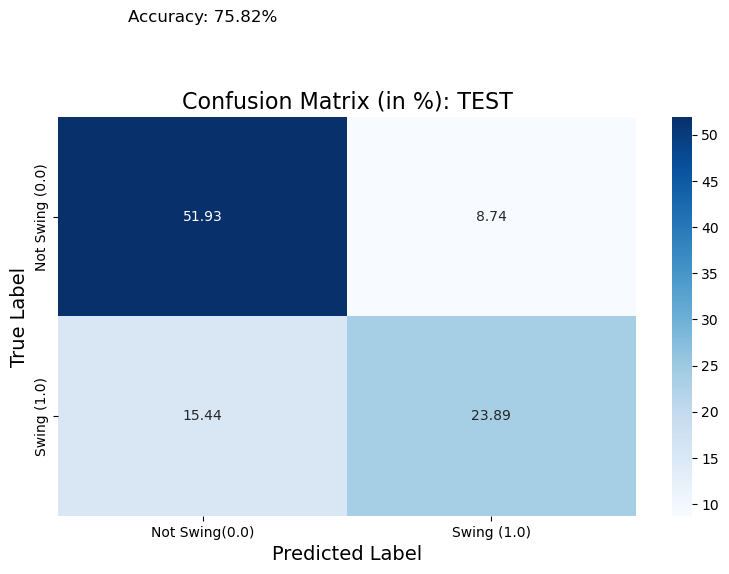

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate confusion matrix and normalize it to percentages
cm_values = confusion_matrix(y_val_time, y_val_pred) / val_time_data['swing_voter'].shape[0] * 100

# Create the confusion matrix plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_values, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): TEST', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values[0, 0] + cm_values[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

In [ ]:
perturbed_data = [explore_data_helper.perturb_dataframe(df_temp) for i in range(100)]

In [ ]:
def fit_models(df,cat):
    y = df['swing_voter']
    X = df.drop(columns = 'swing_voter')
    # Train CatBoost
    if cat:
        cat_model = CatBoostClassifier(verbose=0)  # Verbose=0 suppresses training output
        cat_model.fit(X,y)
        return cat_model
    else:
        model = LogisticRegression(class_weight='balanced', random_state=42, penalty='l2', C=10, solver='liblinear')
        model.fit(X=X,y=y)

        return model

df_temp = X_train_time
df_temp['swing_voter'] = y_train_time

cat_perturbed = [fit_models(df,True) for df in perturbed_data]
LG_perturbed = [fit_models(df,False) for df in perturbed_data]
#results = Parallel(n_jobs=-1)(delayed(fit_models)(df) for df in perturbed_data)

In [32]:
#cat_perturbed, LG_perturbed = zip(*results)

In [ ]:
cat_perturbed

In [ ]:
cat_perturbed_ = [cat_perturbed[i].predict(y_val_time) for i in range(100)]
LG_perturbed_ = [LG_perturbed[i].predict(y_val_time) for i in range(100)]

In [ ]:
def plot_prediction_range(pred_list, title=None, sample_index=None, ax=None):
    """
    Plots the range of predicted probabilities for logistic regression over multiple iterations.

    Args:
        pred_list (list of np.array): List of predicted probabilities from multiple iterations or models.
        title (str): Title for the plot.
        sample_index (list): Indices of the samples to include in the plot.
        ax (matplotlib axis): Axis to plot on. If None, a new figure is created.

    Returns:
        ax: The matplotlib axis object with the plot.
    """
    import pandas as pd
    import matplotlib.pyplot as plt
    
    if sample_index is None:
        sample_index = list(range(pred_list[0].size))
    
    # Extract predictions and format them into a DataFrame
    pred_list = [pred_list[i][sample_index] for i in range(len(pred_list))]
    pred_list_df = pd.DataFrame(pred_list).T
    pred_list_df['id'] = sample_index
    pred_list_df['true'] = [y_val[i] for i in sample_index]  # Replace `y_val` with your true labels
    pred_list_df = pd.melt(pred_list_df, id_vars=['id', 'true'], var_name='iter', value_name='pred')
    pred_list_df = pred_list_df.groupby(['id', 'true']).agg({'pred': ['min', 'max']})
    pred_list_df = pred_list_df.reset_index()
    pred_list_df = pred_list_df.set_index('id')

    # Use provided axis or create a new one
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 6))  # Default size if no axis is provided

    # Plot horizontal line segments for each observation
    for i in pred_list_df.index:
        ax.plot(
            [pred_list_df.loc[i, ('pred', 'min')], pred_list_df.loc[i, ('pred', 'max')]],
            [pred_list_df.loc[i, 'true'], pred_list_df.loc[i, 'true']],
            color='black'
        )

    # Add labels for probabilities (0 to 1 for logistic regression)
    ax.set_xlim(0, 1)
    ax.set_xlabel('Predicted Probability Range')
    ax.set_ylabel('True Label (Swing Voter)')
    ax.set_yticks([0, 1])  # Binary labels: 0 (non-swing) and 1 (swing)

    # Add title and grid
    if title:
        ax.set_title(title)
    ax.grid(True)

    # Return the axis object for further customization (optional)
    return ax

# Randomly sample 150 indices for visualization
val_sample_id = np.random.choice(len(y_val_time), 150, replace=False)
plot_prediction_range(cat_perturbed, 'Cat Boost', sample_index=val_sample_id)
plot_prediction_range(LG_perturbed, 'Logistic Regression', sample_index=val_sample_id)

In [22]:
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix

# Train XGBoost
xgb_model = XGBClassifier(eval_metric="logloss", use_label_encoder=False)
xgb_model.fit(X_train_time, y_train_time)

# Predict Probabilities
y_pred_time = xgb_model.predict_proba(X_val_time)[:, 1].round(0)


# Evaluate Performance
conf_matrix = confusion_matrix(y_val_time, y_pred_time)
print(f"Confusion Matrix:\n{conf_matrix}")
print(classification_report(y_val_time, y_pred_time))
print("Accuracy:", accuracy_score(y_val_time, y_val_pred))

C:\Users\15184\anaconda3\Lib\site-packages\xgboost\core.py:158: UserWarning: [15:44:54] WARNING: C:\b\abs_90_bwj_86a\croot\xgboost-split_1724073762025\work\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Confusion Matrix:
[[4063  752]
 [1191 1930]]
              precision    recall  f1-score   support

       False       0.77      0.84      0.81      4815
        True       0.72      0.62      0.67      3121

    accuracy                           0.76      7936
   macro avg       0.75      0.73      0.74      7936
weighted avg       0.75      0.76      0.75      7936

Accuracy: 0.7581905241935484


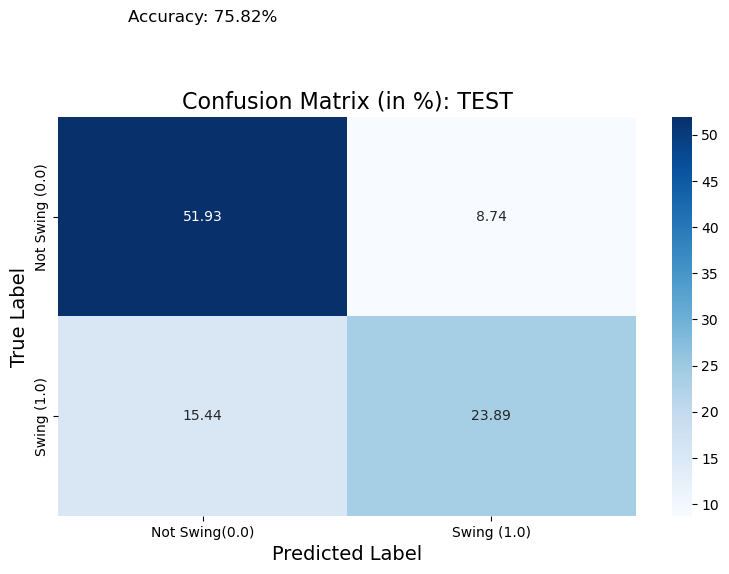

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate confusion matrix and normalize it to percentages
cm_values = confusion_matrix(y_val_time, y_val_pred) / val_time_data['swing_voter'].shape[0] * 100

# Create the confusion matrix plot
plt.figure(figsize=(8, 6))
sns.heatmap(cm_values, annot=True, fmt='.2f', cmap='Blues', 
            xticklabels=['Not Swing(0.0)', 'Swing (1.0)'], 
            yticklabels=['Not Swing (0.0)', 'Swing (1.0)'])

# Set plot labels and title
plt.title('Confusion Matrix (in %): TEST', fontsize=16)
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)

# Display the accuracy as a percentage
accuracy = (cm_values[0, 0] + cm_values[1, 1])
plt.text(0.5, -0.5, f'Accuracy: {accuracy:.2f}%', fontsize=12, ha='center', va='center', color='black')

# Show the plot
plt.tight_layout()
plt.show()

In [84]:
print(train_data.columns)
drop = [col for col in train_data.columns if "vote" in col.lower()]
print(drop)

Index(['weights', 'PRE_approvalOfPresidentCovidResponse', 'PRE_ThermoBiden',
       'PRE_ThermoTrump', 'PRE_ThermoHarris', 'PRE_ThermoPence',
       'PRE_ThermoObama', 'PRE_ThermoDemParty', 'PRE_ThermoRepParty',
       'PRE_YearsAtAddress',
       ...
       'POST_ProblemMention_Race relations',
       'POST_ProblemMention_Partisan politics',
       'POST_ProblemMention_Politicians',
       'POST_ProblemMention_Government (all other)',
       'POST_ProblemMention_The economy', 'POST_ProblemMention_Recession',
       'POST_ProblemMention_Elections', 'POST_ProblemMention_Unity /division',
       'POST_ProblemMention_Health care', 'POST_ProblemMention_Other'],
      dtype='object', length=127)
['PRE_SummaryVoteDutyChoice', 'PRE_VoteAccuracy', 'POST_VoteAccuracy', 'swing_vote', 'PRE_VotePresident_Donald Trump', 'PRE_VotePresident_Jo Jorgensen', 'PRE_VotePresident_Howie Hawkins', 'PRE_VotePresident_Other', 'POST_Voted2020_Registered and did not vote', 'POST_Voted2020_Voted', 'POST_VotePresi

In [94]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn.linear_model import LogisticRegression, Ridge, Lasso
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.preprocessing import OneHotEncoder, scale, StandardScaler
import statsmodels.api as sm
from itertools import product
from joblib import Parallel, delayed
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=42)

y_train = train_data['swing_vote']
X_train = train_data.drop(columns=drop, axis=1)

y_val = val_data['swing_vote']
X_val = val_data.drop(columns=drop,axis=1)

model_2020 = LogisticRegression(class_weight='balanced', random_state=42, penalty='l2', C=10, solver='liblinear')
model_2020.fit(X=X_train,
               y=y_train)

y_val_pred = model_2020.predict(X=X_val)

In [95]:
print("Confusion Matrix:\n", confusion_matrix(y_val, y_val_pred))
print("Accuracy:", accuracy_score(y_val, y_val_pred))
print("Classification Report:\n", classification_report(y_val, y_val_pred))

Confusion Matrix:
 [[788 277]
 [ 54 123]]
Accuracy: 0.7334943639291466
Classification Report:
               precision    recall  f1-score   support

       False       0.94      0.74      0.83      1065
        True       0.31      0.69      0.43       177

    accuracy                           0.73      1242
   macro avg       0.62      0.72      0.63      1242
weighted avg       0.85      0.73      0.77      1242



In [96]:
mapped_dict = dict(zip(X_train.columns, model_2020.coef_[0]))
sorted_coef = sorted(mapped_dict.items(), key=lambda item: abs(item[1]), reverse=True)

# Print the highest absolute value coefficients
print("Highest absolute value coefficients:")
for feature, coef in sorted_coef:
    print(f"{feature}: {coef}")

Highest absolute value coefficients:
StateRegistration_Wyoming: 3.3225009016604163
POST_ProblemMention_Elections: -2.680938761247481
StateRegistration_New Mexico: 2.011867630231953
StateRegistration_Alaska: -1.6342463171607464
StateRegistration_New Hampshire: 1.6056726603689206
StateRegistration_Rhode Island: 1.5871936736332313
StateRegistration_Maine: 1.4855073172178512
StateRegistration_North Dakota: 1.3085985474708188
StateRegistration_Montana: 1.2918061194065191
StateRegistration_Idaho: 1.274991680359848
StateRegistration_Missouri: 1.2074096638851415
StateRegistration_Minnesota: 1.2073831202287635
StateRegistration_Oklahoma: 1.1815212656690517
StateRegistration_Pennsylvania: 1.1356207125449218
StateRegistration_Nebraska: 1.050969692745329
StateRegistration_Maryland: 1.0241525451442242
POST_ProblemMention_Government (all other): -1.0024879786360936
EducationLevel_Professional/Doctoral degree: -0.9533850993340951
StateRegistration_Illinois: 0.920305403433137
StateRegistration_New Jer